Results Notebook

In [1]:
from ReadData import read_data
import xpress as xp
import matplotlib.pyplot as plt
import pandas as pd
from scipy.interpolate import interp1d
from ReadData import interp
from datetime import datetime, timedelta
from ReadData import find_fixed_replace
from ReadData import periods_between
from ReadData import scaled_PPA
from x_FinalModel import planning_model
from x_FinalModel import operational_model
from x_FinalModel import find_gamma


In [2]:
import importlib
import x_FinalModel
importlib.reload(x_FinalModel)

<module 'x_FinalModel' from '/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/x_FinalModel.py'>

In [3]:

df_RE, df_Grid, df_Elctro, df_Elctro_Costs_before, df_Battery, df_PPA, df_repperiods, df_lifetime, df_2MW, df_20MW, df_200MW, df_Elctro_Costs_2MW, df_Elctro_Costs_20MW, df_Elctro_Costs_200MW = read_data()
df_rep_costs = df_2MW
Demand = 235
# df_stack_replacement = df_2MW
df_Elctro_Costs = df_Elctro_Costs_2MW
miprelstop = 0.0
maxtime = 3600
P_PPA = scaled_PPA(df_RE,normalise=True)

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:311: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  return int((ts2 - ts1) / pd.to_timedelta(1, unit=freq))


In [4]:
df_Grid

,Report_Year,Report_Month,Report_Day,Report_Hour,"Price (£/kWh, real 2025)",CO2 Intensity (kg CO2/kWh)
0,2025,1,1,1,0.067262,0.04432
1,2025,1,1,2,0.066458,0.04545
2,2025,1,1,3,0.066458,0.04566
3,2025,1,1,4,0.066458,0.04570
4,2025,1,1,5,0.066458,0.04589
...,...,...,...,...,...,...
227899,2050,12,31,20,0.154205,0.01338
227900,2050,12,31,21,0.153855,0.01302
227901,2050,12,31,22,0.154205,0.01194
227902,2050,12,31,23,0.154205,0.01104


/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


FICO Xpress v9.4.2, Hyper, solve started 20:22:48, Aug 8, 2025
Heap usage: 1858MB (peak 1858MB, 55MB system)
Minimizing MILP Hydrogen WoodMac using up to 8 threads and up to 8192MB memory, with these control settings:
MAXTIME = 60000
OUTPUTLOG = 1
MIPRELSTOP = 0
TIMELIMIT = 60000
NLPPOSTSOLVE = 1
XSLP_DELETIONCONTROL = 0
XSLP_OBJSENSE = 1
Original problem has:
   4341032 rows      2506958 cols      9942748 elements         3 entities
Presolved problem has:
   1677663 rows      1118939 cols      4707344 elements         3 entities
LP relaxation tightened
Presolve finished in 177 seconds
Heap usage: 2363MB (peak 4263MB, 55MB system)

Coefficient range                    original                 solved        
  Coefficients   [min,max] : [ 6.08e-09,  1.78e+11] / [ 1.12e-03,  5.14e+01]
  RHS and bounds [min,max] : [ 1.00e+00,  2.35e+02] / [ 1.00e+00,  2.15e+09]
  Objective      [min,max] : [ 1.13e-10,  1.96e+09] / [ 1.69e-10,  9.98e-01]
Autoscaling applied Curtis-Reid scaling

Will try to

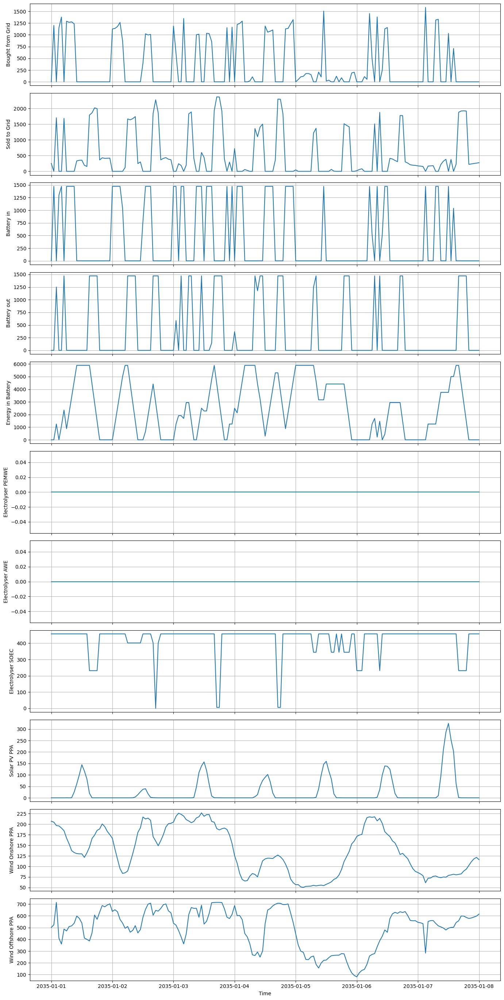

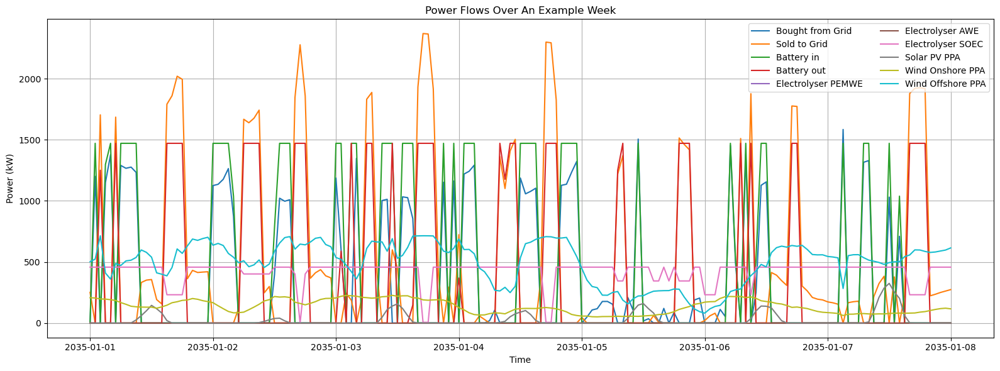

In [5]:
# Planning model 2035 Jan
PPA_sol_2035, Ez_cap_sol_2035, Bat_cap_sol_2035, P_Ez_sol_2035, P_Bat_in_sol_2035, P_Bat_out_sol_2035, Av_hr_yr_P_Ez_sol_2035, Av_hr_yr_P_Bat_in_sol_2035, Av_hr_yr_P_Bat_out_sol_2035 = planning_model(P_PPA,df_Grid, df_Elctro, df_Elctro_Costs, df_Battery, df_PPA, Demand, DemandCycle='Daily', GreenLimit='Weekly',  df_lifetime= df_lifetime, df_rep_costs= df_2MW, gamma=0.9, alpha=2, beta=1, delta1=1, delta2=1, delta3=1, target_year =2035, target_month = 1,Project_Years = 26, miprelstop = 0.0, maxtime = 60000)

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


FICO Xpress v9.4.2, Hyper, solve started 20:58:22, Aug 8, 2025
Heap usage: 1858MB (peak 1858MB, 55MB system)
Minimizing MILP Hydrogen WoodMac using up to 8 threads and up to 8192MB memory, with these control settings:
MAXTIME = 60000
OUTPUTLOG = 1
MIPRELSTOP = 0
TIMELIMIT = 60000
NLPPOSTSOLVE = 1
XSLP_DELETIONCONTROL = 0
XSLP_OBJSENSE = 1
Original problem has:
   4341032 rows      2506958 cols      9942748 elements         3 entities
Presolved problem has:
   1677663 rows      1118939 cols      4707344 elements         3 entities
LP relaxation tightened
Presolve finished in 177 seconds
Heap usage: 2363MB (peak 4263MB, 55MB system)

Coefficient range                    original                 solved        
  Coefficients   [min,max] : [ 6.08e-09,  1.78e+11] / [ 1.12e-03,  5.14e+01]
  RHS and bounds [min,max] : [ 1.00e+00,  2.35e+02] / [ 1.00e+00,  2.15e+09]
  Objective      [min,max] : [ 1.13e-10,  1.96e+09] / [ 1.69e-10,  9.98e-01]
Autoscaling applied Curtis-Reid scaling

Will try to

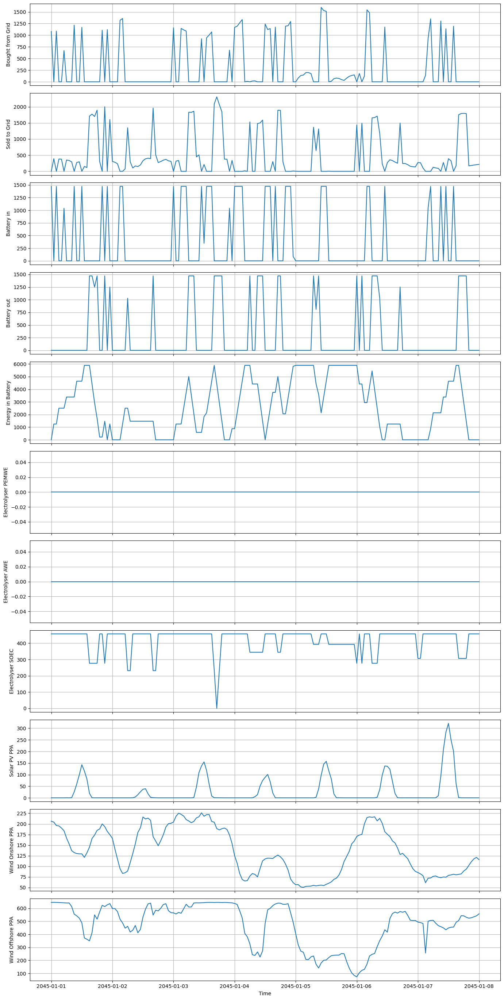

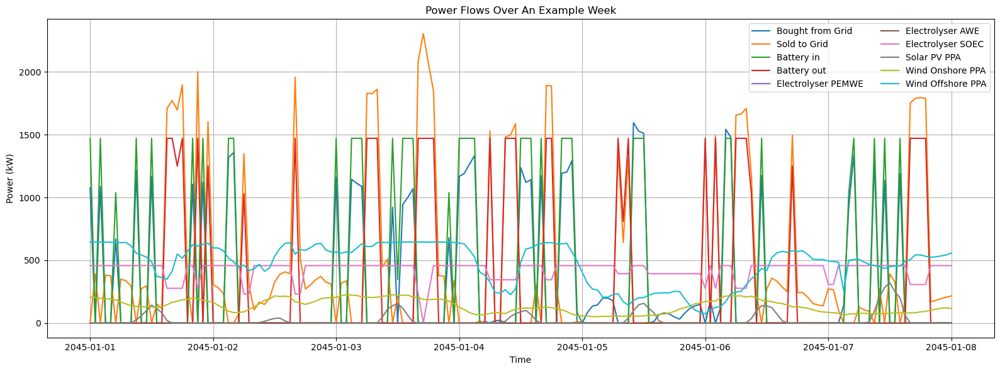

In [6]:
# Planning model 2045
PPA_sol_2045, Ez_cap_sol_2045, Bat_cap_sol_2045, P_Ez_sol_2045, P_Bat_in_sol_2045, P_Bat_out_sol_2045, Av_hr_yr_P_Ez_sol_2045, Av_hr_yr_P_Bat_in_sol_2045, Av_hr_yr_P_Bat_out_sol_2045 = planning_model(P_PPA,df_Grid, df_Elctro, df_Elctro_Costs, df_Battery, df_PPA, Demand, DemandCycle='Daily', GreenLimit='Weekly',  df_lifetime= df_lifetime, df_rep_costs= df_2MW, gamma=0.9, alpha=2, beta=1, delta1=1, delta2=1, delta3=1, target_year =2045, target_month = 1,Project_Years = 26, miprelstop = 0.0, maxtime = 60000)

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


FICO Xpress v9.4.2, Hyper, solve started 6:32:28, Aug 10, 2025
Heap usage: 1858MB (peak 1858MB, 55MB system)
Minimizing MILP Hydrogen WoodMac using up to 8 threads and up to 8192MB memory, with these control settings:
MAXTIME = 60000
OUTPUTLOG = 1
MIPRELSTOP = 0
TIMELIMIT = 60000
NLPPOSTSOLVE = 1
XSLP_DELETIONCONTROL = 0
XSLP_OBJSENSE = 1
Original problem has:
   4341032 rows      2506958 cols      9942748 elements         3 entities
Presolved problem has:
   1677663 rows      1118939 cols      4707344 elements         3 entities
LP relaxation tightened
Presolve finished in 177 seconds
Heap usage: 2363MB (peak 4263MB, 55MB system)

Coefficient range                    original                 solved        
  Coefficients   [min,max] : [ 6.08e-09,  1.78e+11] / [ 1.12e-03,  5.14e+01]
  RHS and bounds [min,max] : [ 1.00e+00,  2.35e+02] / [ 1.00e+00,  2.15e+09]
  Objective      [min,max] : [ 1.13e-10,  1.96e+09] / [ 1.69e-10,  9.98e-01]
Autoscaling applied Curtis-Reid scaling

Will try to

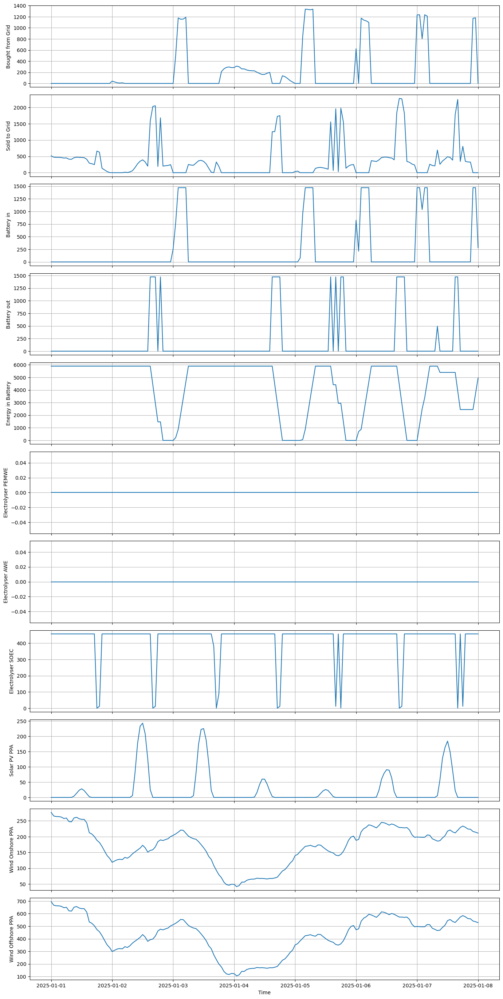

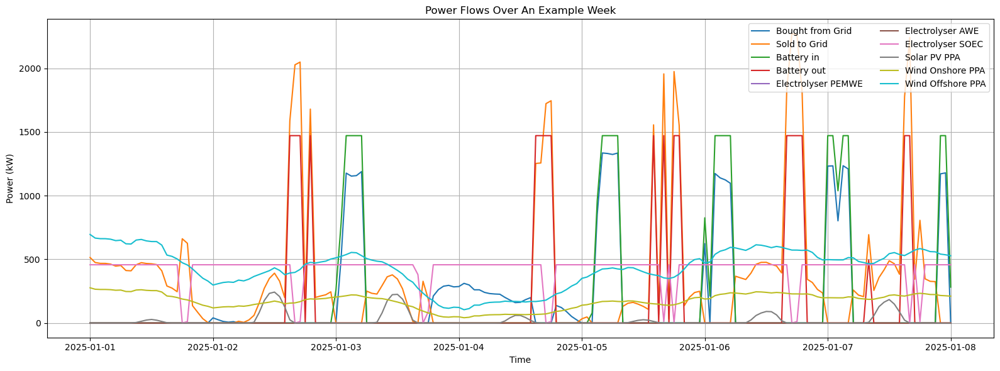

In [4]:
# Planning model 2025
PPA_sol_2025, Ez_cap_sol_2025, Bat_cap_sol_2025, P_Ez_sol_2025, P_Bat_in_sol_2025, P_Bat_out_sol_2025, Av_hr_yr_P_Ez_sol_2025, Av_hr_yr_P_Bat_in_sol_2025, Av_hr_yr_P_Bat_out_sol_2025 = planning_model(P_PPA,df_Grid, df_Elctro, df_Elctro_Costs, df_Battery, df_PPA, Demand, DemandCycle='Daily', GreenLimit='Weekly',  df_lifetime= df_lifetime, df_rep_costs= df_2MW, gamma=0.9, alpha=2, beta=1, delta1=1, delta2=1, delta3=1, target_year =2025, target_month = 1,Project_Years = 26, miprelstop = 0.0, maxtime = 60000)

     Report_Year  Report_Month  Report_Day  Report_Hour  \
0           2025             1           1            1   
1           2025             1           1            2   
2           2025             1           1            3   
3           2025             1           1            4   
4           2025             1           1            5   
..           ...           ...         ...          ...   
235         2025             1          10           20   
236         2025             1          10           21   
237         2025             1          10           22   
238         2025             1          10           23   
239         2025             1          10           24   

     Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
0                    0.067262                     0.04432  
1                    0.066458                     0.04545  
2                    0.066458                     0.04566  
3                    0.066458                     0

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)
/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


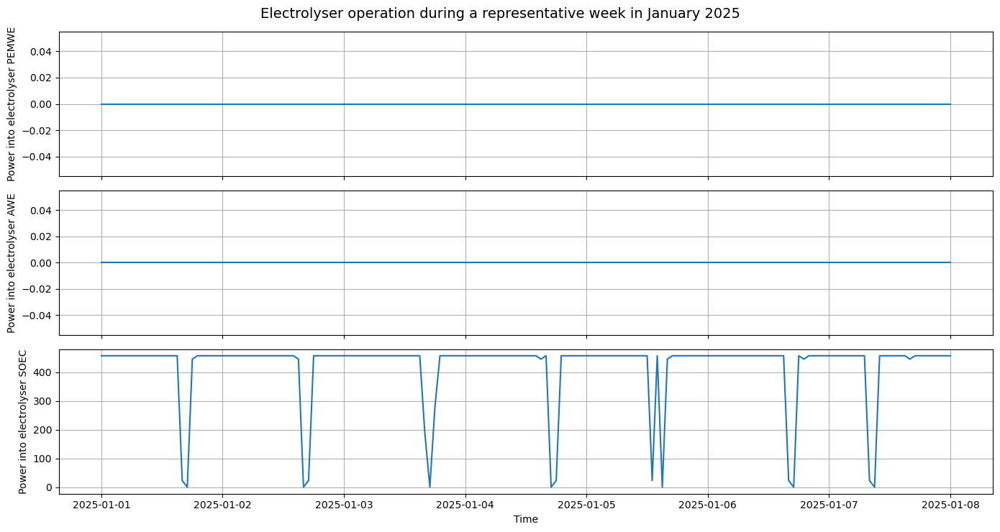

In [5]:
# Operational model on same week from 2025
year_set = [2025]
month_set = [1]
new_gamma, proportion_of_hours_on_each_week,P_Ez_sol_2025_1wk, P_Bat_in_sol_2025_1wk, P_Bat_out_sol_2025_1wk = find_gamma(year_set,month_set,P_PPA,df_Grid, df_Elctro, df_Elctro_Costs,df_Battery,df_PPA,Demand,DemandCycle='Daily',GreenLimit='Weekly',df_lifetime=df_lifetime,df_rep_costs=df_2MW,PPA_sol = PPA_sol_2025, Ez_cap_sol=Ez_cap_sol_2025, Bat_cap_sol=Bat_cap_sol_2025, gamma=0.9,alpha=2,beta=1,Project_Years=26,miprelstop=0.0,maxtime=600000)

/var/folders/85/dwb0q_9j2fn8b25x10tcqqmw0000gn/T/ipykernel_56899/2365777436.py:23: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time_index = pd.date_range(start=f"{year}-01-01 00:00", periods=len(bat_in_week), freq="H")


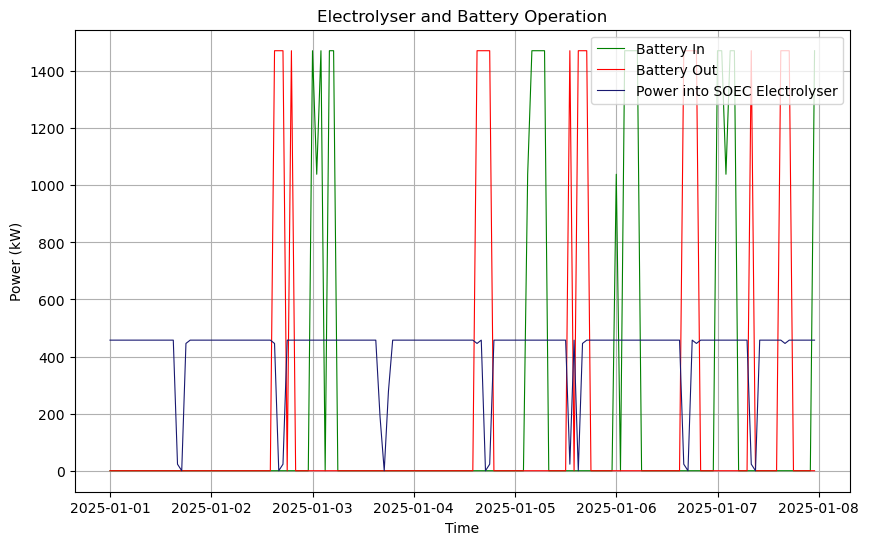

/var/folders/85/dwb0q_9j2fn8b25x10tcqqmw0000gn/T/ipykernel_56899/2365777436.py:23: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  time_index = pd.date_range(start=f"{year}-01-01 00:00", periods=len(bat_in_week), freq="H")


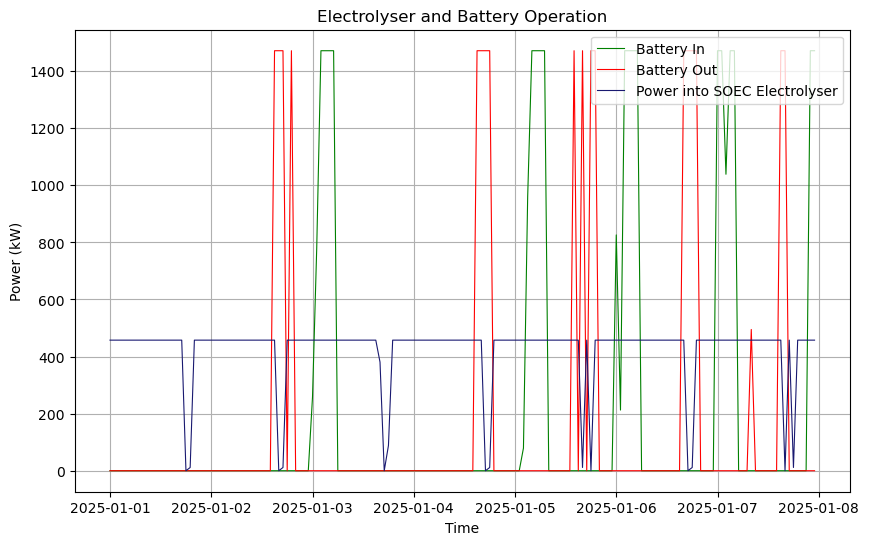

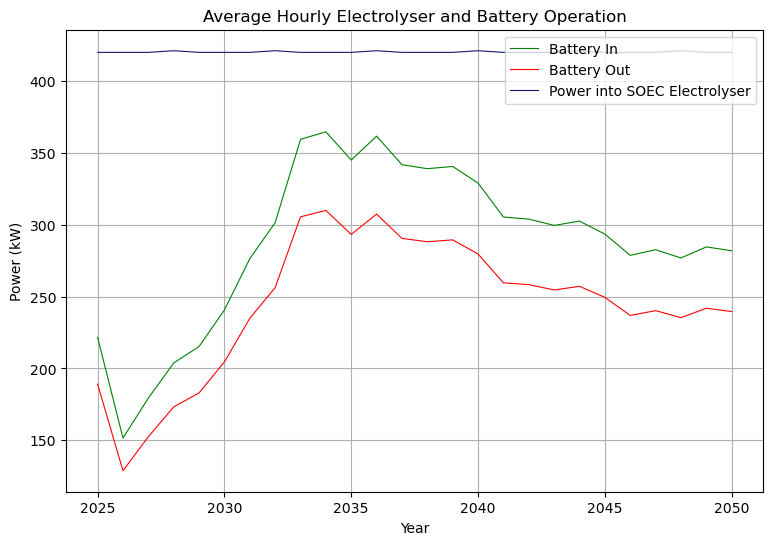

In [14]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_weekly_PEz_bat(P_Ez_sol_2025, P_Bat_in_sol_2025, P_Bat_out_sol_2025, year=2025, week_days=7):
    plt.figure(figsize=(10,6))

    # Convert dicts to Series
    bat_in_series = pd.Series(P_Bat_in_sol_2025)
    bat_out_series = pd.Series(P_Bat_out_sol_2025)
    P_Ez_series = pd.Series(P_Ez_sol_2025)
    
    # Convert indexes
    bat_in_series.index = pd.MultiIndex.from_tuples(bat_in_series.index, names=["y", "m", "d", "h"])
    bat_out_series.index = pd.MultiIndex.from_tuples(bat_out_series.index, names=["y", "m", "d", "h"])
    P_Ez_series.index = pd.MultiIndex.from_tuples(P_Ez_series.index, names=["e", "y", "m", "d", "h"])

    # Filter for first week of the year
    bat_in_week = bat_in_series.loc[(year, 1, slice(1, week_days))]
    bat_out_week = bat_out_series.loc[(year, 1, slice(1, week_days))]
    soec_week = P_Ez_series.xs("SOEC", level=0).loc[(year, 1, slice(1, week_days))]

    # Create time axis as datetime
    time_index = pd.date_range(start=f"{year}-01-01 00:00", periods=len(bat_in_week), freq="H")

    # Plot
    plt.plot(time_index, bat_in_week.values, color='green', linewidth=0.8, label='Battery In')
    plt.plot(time_index, bat_out_week.values, color='red', linewidth=0.8, label='Battery Out')
    plt.plot(time_index, soec_week.values, color='midnightblue', linewidth=0.8, label='Power into SOEC Electrolyser')

    plt.xlabel('Time')
    plt.ylabel('Power (kW)')
    plt.title(f'Electrolyser and Battery Operation')
    plt.grid(True)
    plt.legend(loc='upper right')
    plt.show()

plot_weekly_PEz_bat(P_Ez_sol_2025_1wk, P_Bat_in_sol_2025_1wk, P_Bat_out_sol_2025_1wk, year=2025, week_days=7)
plot_weekly_PEz_bat(P_Ez_sol_2025, P_Bat_in_sol_2025, P_Bat_out_sol_2025, year=2025, week_days=7)
# Bat,Ez for 2025 week from operational
# P_Ez_sol_2025_1wk, P_Bat_in_sol_2025_1wk, P_Bat_out_sol_2025_1wk


# Bat Ez for 2025 week from planning
# P_Ez_sol_2025, P_Bat_in_sol_2025, P_Bat_out_sol_2025,

# average over yrs
# Av_hr_yr_P_Ez_sol_2025, Av_hr_yr_P_Bat_in_sol_2025, Av_hr_yr_P_Bat_out_sol_2025 


import matplotlib.pyplot as plt
import pandas as pd

def plot_yearly_PEz_bat(Av_hr_yr_P_Ez_sol_2025, Av_hr_yr_P_Bat_in_sol_2025, Av_hr_yr_P_Bat_out_sol_2025):
    plt.figure(figsize=(9,6))

    # Convert battery dicts to Series
    bat_in_series = pd.Series(Av_hr_yr_P_Bat_in_sol_2025)
    bat_out_series = pd.Series(Av_hr_yr_P_Bat_out_sol_2025)

    # Plot battery series
    plt.plot(bat_in_series.index, bat_in_series.values,
             color='green', linewidth=0.8, label='Battery In')
    plt.plot(bat_out_series.index, bat_out_series.values,
             color='red', linewidth=0.8, label='Battery Out')

    # Convert P_Ez dict to MultiIndex Series and extract only SOEC
    P_Ez_series = pd.Series(Av_hr_yr_P_Ez_sol_2025)
    P_Ez_series.index = pd.MultiIndex.from_tuples(P_Ez_series.index, names=["e", "y"])
    soec_data = P_Ez_series.xs("SOEC", level=0)

    # Plot SOEC P_Ez
    plt.plot(soec_data.index, soec_data.values, color='midnightblue', linewidth=0.8, label='Power into SOEC Electrolyser')

    plt.xlabel('Year')
    plt.ylabel('Power (kW)')
    plt.title('Average Hourly Electrolyser and Battery Operation')
    plt.grid(True)
    plt.legend(loc='upper right')
    plt.show()

# Av_hr_yr_P_Bat_out_sol_2025[2049]
# Example:
plot_yearly_PEz_bat(Av_hr_yr_P_Ez_sol_2025, Av_hr_yr_P_Bat_in_sol_2025, Av_hr_yr_P_Bat_out_sol_2025)


     Report_Year  Report_Month  Report_Day  Report_Hour  \
0           2025             1           1            1   
1           2025             1           1            2   
2           2025             1           1            3   
3           2025             1           1            4   
4           2025             1           1            5   
..           ...           ...         ...          ...   
235         2025             1          10           20   
236         2025             1          10           21   
237         2025             1          10           22   
238         2025             1          10           23   
239         2025             1          10           24   

     Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
0                    0.067262                     0.04432  
1                    0.066458                     0.04545  
2                    0.066458                     0.04566  
3                    0.066458                     0

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
1416         2025             3           1            1   
1417         2025             3           1            2   
1418         2025             3           1            3   
1419         2025             3           1            4   
1420         2025             3           1            5   
...           ...           ...         ...          ...   
1651         2025             3          10           20   
1652         2025             3          10           21   
1653         2025             3          10           22   
1654         2025             3          10           23   
1655         2025             3          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
1416                  0.015903                     0.02391  
1417                  0.015903                     0.02358  
1418                  0.015903                     0.02337  
1419                  0.015903     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
2880         2025             5           1            1   
2881         2025             5           1            2   
2882         2025             5           1            3   
2883         2025             5           1            4   
2884         2025             5           1            5   
...           ...           ...         ...          ...   
3115         2025             5          10           20   
3116         2025             5          10           21   
3117         2025             5          10           22   
3118         2025             5          10           23   
3119         2025             5          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
2880                  0.045477                     0.01827  
2881                  0.046263                     0.02522  
2882                  0.045477                     0.01885  
2883                  0.055591     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
4344         2025             7           1            1   
4345         2025             7           1            2   
4346         2025             7           1            3   
4347         2025             7           1            4   
4348         2025             7           1            5   
...           ...           ...         ...          ...   
4579         2025             7          10           20   
4580         2025             7          10           21   
4581         2025             7          10           22   
4582         2025             7          10           23   
4583         2025             7          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
4344                  0.056951                     0.01932  
4345                  0.056951                     0.01907  
4346                  0.056951                     0.01932  
4347                  0.056951     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
5832         2025             9           1            1   
5833         2025             9           1            2   
5834         2025             9           1            3   
5835         2025             9           1            4   
5836         2025             9           1            5   
...           ...           ...         ...          ...   
6067         2025             9          10           20   
6068         2025             9          10           21   
6069         2025             9          10           22   
6070         2025             9          10           23   
6071         2025             9          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
5832                  0.071810                     0.19286  
5833                  0.071810                     0.19488  
5834                  0.071810                     0.19147  
5835                  0.071810     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
7296         2025            11           1            1   
7297         2025            11           1            2   
7298         2025            11           1            3   
7299         2025            11           1            4   
7300         2025            11           1            5   
...           ...           ...         ...          ...   
7531         2025            11          10           20   
7532         2025            11          10           21   
7533         2025            11          10           22   
7534         2025            11          10           23   
7535         2025            11          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
7296                  0.065056                     0.14131  
7297                  0.066903                     0.14722  
7298                  0.065056                     0.14771  
7299                  0.065056     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
43824         2030             1           1            1   
43825         2030             1           1            2   
43826         2030             1           1            3   
43827         2030             1           1            4   
43828         2030             1           1            5   
...            ...           ...         ...          ...   
44059         2030             1          10           20   
44060         2030             1          10           21   
44061         2030             1          10           22   
44062         2030             1          10           23   
44063         2030             1          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
43824                  0.000205                     0.01098  
43825                  0.000205                     0.01100  
43826                  0.000205                     0.01110  
43827              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
45240         2030             3           1            1   
45241         2030             3           1            2   
45242         2030             3           1            3   
45243         2030             3           1            4   
45244         2030             3           1            5   
...            ...           ...         ...          ...   
45475         2030             3          10           20   
45476         2030             3          10           21   
45477         2030             3          10           22   
45478         2030             3          10           23   
45479         2030             3          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
45240                  0.000205                     0.01189  
45241                  0.000205                     0.01178  
45242                  0.000205                     0.01191  
45243              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
46704         2030             5           1            1   
46705         2030             5           1            2   
46706         2030             5           1            3   
46707         2030             5           1            4   
46708         2030             5           1            5   
...            ...           ...         ...          ...   
46939         2030             5          10           20   
46940         2030             5          10           21   
46941         2030             5          10           22   
46942         2030             5          10           23   
46943         2030             5          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
46704                  0.007883                     0.00954  
46705                  0.007883                     0.01466  
46706                  0.007883                     0.00970  
46707              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
48168         2030             7           1            1   
48169         2030             7           1            2   
48170         2030             7           1            3   
48171         2030             7           1            4   
48172         2030             7           1            5   
...            ...           ...         ...          ...   
48403         2030             7          10           20   
48404         2030             7          10           21   
48405         2030             7          10           22   
48406         2030             7          10           23   
48407         2030             7          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
48168                  0.000282                     0.00998  
48169                  0.000205                     0.00976  
48170                  0.000205                     0.00998  
48171              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
49656         2030             9           1            1   
49657         2030             9           1            2   
49658         2030             9           1            3   
49659         2030             9           1            4   
49660         2030             9           1            5   
...            ...           ...         ...          ...   
49891         2030             9          10           20   
49892         2030             9          10           21   
49893         2030             9          10           22   
49894         2030             9          10           23   
49895         2030             9          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
49656                  0.076376                     0.22211  
49657                  0.075025                     0.21208  
49658                  0.075025                     0.20896  
49659              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
51120         2030            11           1            1   
51121         2030            11           1            2   
51122         2030            11           1            3   
51123         2030            11           1            4   
51124         2030            11           1            5   
...            ...           ...         ...          ...   
51355         2030            11          10           20   
51356         2030            11          10           21   
51357         2030            11          10           22   
51358         2030            11          10           23   
51359         2030            11          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
51120                  0.073939                     0.08641  
51121                  0.074333                     0.11636  
51122                  0.074162                     0.12082  
51123              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
87648         2035             1           1            1   
87649         2035             1           1            2   
87650         2035             1           1            3   
87651         2035             1           1            4   
87652         2035             1           1            5   
...            ...           ...         ...          ...   
87883         2035             1          10           20   
87884         2035             1          10           21   
87885         2035             1          10           22   
87886         2035             1          10           23   
87887         2035             1          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
87648                  0.000556                    -0.00139  
87649                  0.000205                    -0.00138  
87650                  0.000556                    -0.00114  
87651              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
89064         2035             3           1            1   
89065         2035             3           1            2   
89066         2035             3           1            3   
89067         2035             3           1            4   
89068         2035             3           1            5   
...            ...           ...         ...          ...   
89299         2035             3          10           20   
89300         2035             3          10           21   
89301         2035             3          10           22   
89302         2035             3          10           23   
89303         2035             3          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
89064                  0.000205                    -0.00255  
89065                  0.000205                    -0.00269  
89066                  0.000205                    -0.00283  
89067              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
90528         2035             5           1            1   
90529         2035             5           1            2   
90530         2035             5           1            3   
90531         2035             5           1            4   
90532         2035             5           1            5   
...            ...           ...         ...          ...   
90763         2035             5          10           20   
90764         2035             5          10           21   
90765         2035             5          10           22   
90766         2035             5          10           23   
90767         2035             5          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
90528                  0.000205                    -0.00278  
90529                  0.000205                    -0.00300  
90530                  0.000205                    -0.00288  
90531              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
91992         2035             7           1            1   
91993         2035             7           1            2   
91994         2035             7           1            3   
91995         2035             7           1            4   
91996         2035             7           1            5   
...            ...           ...         ...          ...   
92227         2035             7          10           20   
92228         2035             7          10           21   
92229         2035             7          10           22   
92230         2035             7          10           23   
92231         2035             7          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
91992                  0.000205                    -0.00324  
91993                  0.000205                    -0.00327  
91994                  0.000205                    -0.00328  
91995              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
93480         2035             9           1            1   
93481         2035             9           1            2   
93482         2035             9           1            3   
93483         2035             9           1            4   
93484         2035             9           1            5   
...            ...           ...         ...          ...   
93715         2035             9          10           20   
93716         2035             9          10           21   
93717         2035             9          10           22   
93718         2035             9          10           23   
93719         2035             9          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
93480                  0.091142                     0.07922  
93481                  0.091142                     0.07720  
93482                  0.091142                     0.07606  
93483              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
94944         2035            11           1            1   
94945         2035            11           1            2   
94946         2035            11           1            3   
94947         2035            11           1            4   
94948         2035            11           1            5   
...            ...           ...         ...          ...   
95179         2035            11          10           20   
95180         2035            11          10           21   
95181         2035            11          10           22   
95182         2035            11          10           23   
95183         2035            11          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
94944                  0.092886                     0.01737  
94945                  0.092886                     0.02715  
94946                  0.092886                     0.02863  
94947              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
131472         2040             1           1            1   
131473         2040             1           1            2   
131474         2040             1           1            3   
131475         2040             1           1            4   
131476         2040             1           1            5   
...             ...           ...         ...          ...   
131707         2040             1          10           20   
131708         2040             1          10           21   
131709         2040             1          10           22   
131710         2040             1          10           23   
131711         2040             1          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
131472                  0.002642                    -0.00418  
131473                  0.002291                    -0.00396  
131474                  0.002642                    -0.00367  
131

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
132912         2040             3           1            1   
132913         2040             3           1            2   
132914         2040             3           1            3   
132915         2040             3           1            4   
132916         2040             3           1            5   
...             ...           ...         ...          ...   
133147         2040             3          10           20   
133148         2040             3          10           21   
133149         2040             3          10           22   
133150         2040             3          10           23   
133151         2040             3          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
132912                  0.000205                    -0.00260  
132913                  0.000205                    -0.00214  
132914                  0.000205                    -0.00272  
132

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
134376         2040             5           1            1   
134377         2040             5           1            2   
134378         2040             5           1            3   
134379         2040             5           1            4   
134380         2040             5           1            5   
...             ...           ...         ...          ...   
134611         2040             5          10           20   
134612         2040             5          10           21   
134613         2040             5          10           22   
134614         2040             5          10           23   
134615         2040             5          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
134376                  0.000205                    -0.00258  
134377                  0.000633                    -0.00534  
134378                  0.000205                    -0.00271  
134

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
135840         2040             7           1            1   
135841         2040             7           1            2   
135842         2040             7           1            3   
135843         2040             7           1            4   
135844         2040             7           1            5   
...             ...           ...         ...          ...   
136075         2040             7          10           20   
136076         2040             7          10           21   
136077         2040             7          10           22   
136078         2040             7          10           23   
136079         2040             7          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
135840                  0.000205                    -0.00395  
135841                  0.000205                    -0.00322  
135842                  0.000556                    -0.00417  
135

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/x_FinalModel.py:1013: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(len(plot_df.columns), 1, figsize=(14, 2.5 * len(plot_df.columns)), sharex=True)
/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
137328         2040             9           1            1   
137329         2040             9           1            2   
137330         2040             9           1            3   
137331         2040             9           1            4   
137332         2040             9           1            5   
...             ...           ...         ...          ...   
137563         2040             9          10           20   
137564         2040             9          10           21   
137565         2040             9          10           22   
137566         2040             9          10           23   
137567         2040             9          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
137328                  0.102684                     0.05570  
137329                  0.102684                     0.05539  
137330                  0.102684                     0.05607  
137

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
138792         2040            11           1            1   
138793         2040            11           1            2   
138794         2040            11           1            3   
138795         2040            11           1            4   
138796         2040            11           1            5   
...             ...           ...         ...          ...   
139027         2040            11          10           20   
139028         2040            11          10           21   
139029         2040            11          10           22   
139030         2040            11          10           23   
139031         2040            11          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
138792                  0.112474                     0.03641  
138793                  0.104112                     0.02979  
138794                  0.102607                     0.02843  
138

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
175320         2045             1           1            1   
175321         2045             1           1            2   
175322         2045             1           1            3   
175323         2045             1           1            4   
175324         2045             1           1            5   
...             ...           ...         ...          ...   
175555         2045             1          10           20   
175556         2045             1          10           21   
175557         2045             1          10           22   
175558         2045             1          10           23   
175559         2045             1          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
175320                  0.004378                    -0.00477  
175321                  0.004378                    -0.00529  
175322                  0.004378                    -0.00569  
175

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
176736         2045             3           1            1   
176737         2045             3           1            2   
176738         2045             3           1            3   
176739         2045             3           1            4   
176740         2045             3           1            5   
...             ...           ...         ...          ...   
176971         2045             3          10           20   
176972         2045             3          10           21   
176973         2045             3          10           22   
176974         2045             3          10           23   
176975         2045             3          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
176736                  0.000205                    -0.00449  
176737                  0.000205                    -0.00433  
176738                  0.000205                    -0.00497  
176

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
178200         2045             5           1            1   
178201         2045             5           1            2   
178202         2045             5           1            3   
178203         2045             5           1            4   
178204         2045             5           1            5   
...             ...           ...         ...          ...   
178435         2045             5          10           20   
178436         2045             5          10           21   
178437         2045             5          10           22   
178438         2045             5          10           23   
178439         2045             5          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
178200                  0.000205                    -0.00361  
178201                 -0.001821                    -0.00673  
178202                  0.000205                    -0.00356  
178

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
179664         2045             7           1            1   
179665         2045             7           1            2   
179666         2045             7           1            3   
179667         2045             7           1            4   
179668         2045             7           1            5   
...             ...           ...         ...          ...   
179899         2045             7          10           20   
179900         2045             7          10           21   
179901         2045             7          10           22   
179902         2045             7          10           23   
179903         2045             7          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
179664                  0.000205                    -0.00562  
179665                  0.000205                    -0.00522  
179666                  0.000205                    -0.00582  
179

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
181152         2045             9           1            1   
181153         2045             9           1            2   
181154         2045             9           1            3   
181155         2045             9           1            4   
181156         2045             9           1            5   
...             ...           ...         ...          ...   
181387         2045             9          10           20   
181388         2045             9          10           21   
181389         2045             9          10           22   
181390         2045             9          10           23   
181391         2045             9          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
181152                  0.119818                     0.04178  
181153                  0.119818                     0.04311  
181154                  0.119818                     0.04191  
181

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
182616         2045            11           1            1   
182617         2045            11           1            2   
182618         2045            11           1            3   
182619         2045            11           1            4   
182620         2045            11           1            5   
...             ...           ...         ...          ...   
182851         2045            11          10           20   
182852         2045            11          10           21   
182853         2045            11          10           22   
182854         2045            11          10           23   
182855         2045            11          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
182616                  0.120767                     0.01687  
182617                  0.120767                     0.02751  
182618                  0.120767                     0.03490  
182

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
219144         2050             1           1            1   
219145         2050             1           1            2   
219146         2050             1           1            3   
219147         2050             1           1            4   
219148         2050             1           1            5   
...             ...           ...         ...          ...   
219379         2050             1          10           20   
219380         2050             1          10           21   
219381         2050             1          10           22   
219382         2050             1          10           23   
219383         2050             1          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
219144                  0.006626                    -0.00644  
219145                  0.006481                    -0.00671  
219146                  0.006481                    -0.00653  
219

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
220560         2050             3           1            1   
220561         2050             3           1            2   
220562         2050             3           1            3   
220563         2050             3           1            4   
220564         2050             3           1            5   
...             ...           ...         ...          ...   
220795         2050             3          10           20   
220796         2050             3          10           21   
220797         2050             3          10           22   
220798         2050             3          10           23   
220799         2050             3          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
220560                  0.000205                    -0.00472  
220561                  0.000205                    -0.00454  
220562                  0.000205                    -0.00542  
220

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
222024         2050             5           1            1   
222025         2050             5           1            2   
222026         2050             5           1            3   
222027         2050             5           1            4   
222028         2050             5           1            5   
...             ...           ...         ...          ...   
222259         2050             5          10           20   
222260         2050             5          10           21   
222261         2050             5          10           22   
222262         2050             5          10           23   
222263         2050             5          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
222024                  0.000205                    -0.00359  
222025                  0.000333                    -0.00509  
222026                  0.000205                    -0.00385  
222

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
223488         2050             7           1            1   
223489         2050             7           1            2   
223490         2050             7           1            3   
223491         2050             7           1            4   
223492         2050             7           1            5   
...             ...           ...         ...          ...   
223723         2050             7          10           20   
223724         2050             7          10           21   
223725         2050             7          10           22   
223726         2050             7          10           23   
223727         2050             7          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
223488                  0.000205                    -0.00508  
223489                  0.000205                    -0.00400  
223490                  0.000205                    -0.00527  
223

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
224976         2050             9           1            1   
224977         2050             9           1            2   
224978         2050             9           1            3   
224979         2050             9           1            4   
224980         2050             9           1            5   
...             ...           ...         ...          ...   
225211         2050             9          10           20   
225212         2050             9          10           21   
225213         2050             9          10           22   
225214         2050             9          10           23   
225215         2050             9          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
224976                  0.152136                     0.03433  
224977                  0.152136                     0.03289  
224978                  0.152136                     0.03222  
224

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
226440         2050            11           1            1   
226441         2050            11           1            2   
226442         2050            11           1            3   
226443         2050            11           1            4   
226444         2050            11           1            5   
...             ...           ...         ...          ...   
226675         2050            11          10           20   
226676         2050            11          10           21   
226677         2050            11          10           22   
226678         2050            11          10           23   
226679         2050            11          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
226440                  0.126179                     0.01181  
226441                  0.122528                     0.01352  
226442                  0.126179                     0.01730  
226

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)
/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


new gamma: 0.9593750000000002


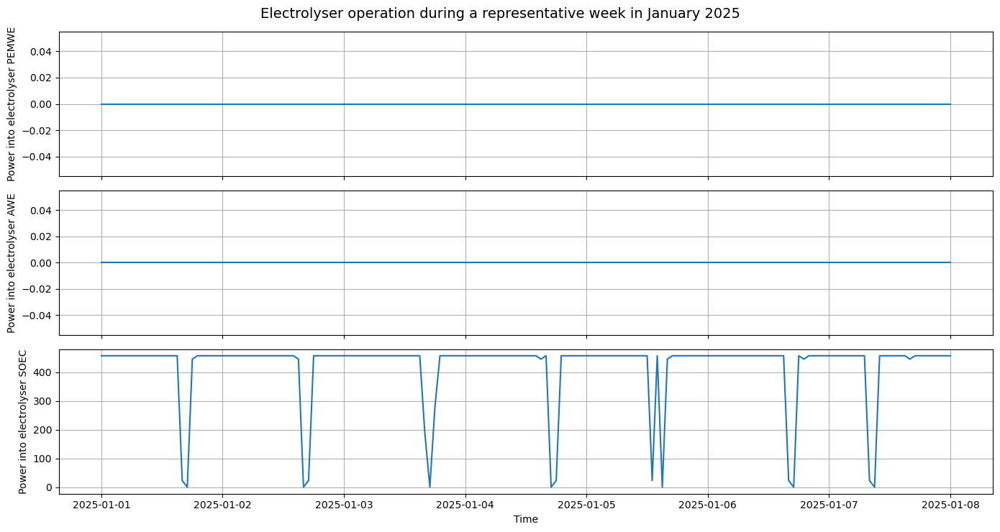

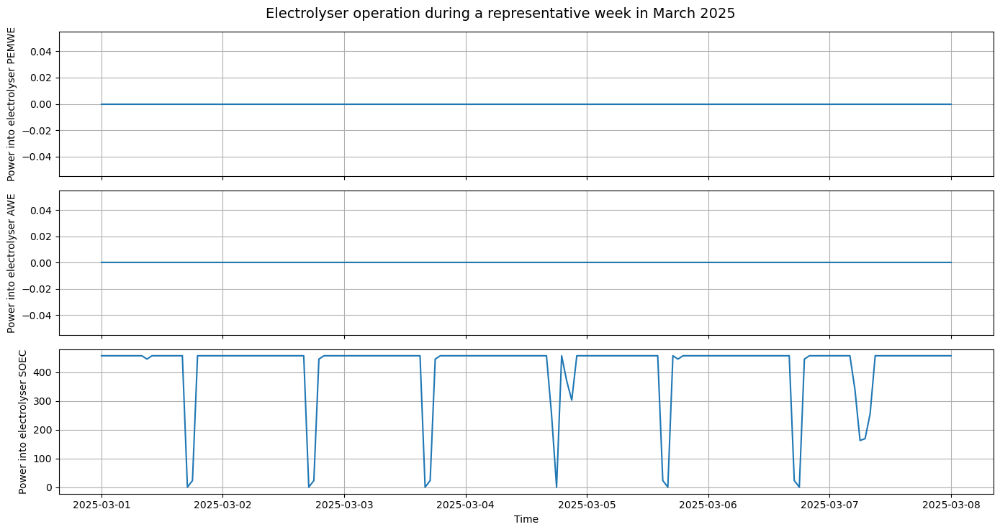

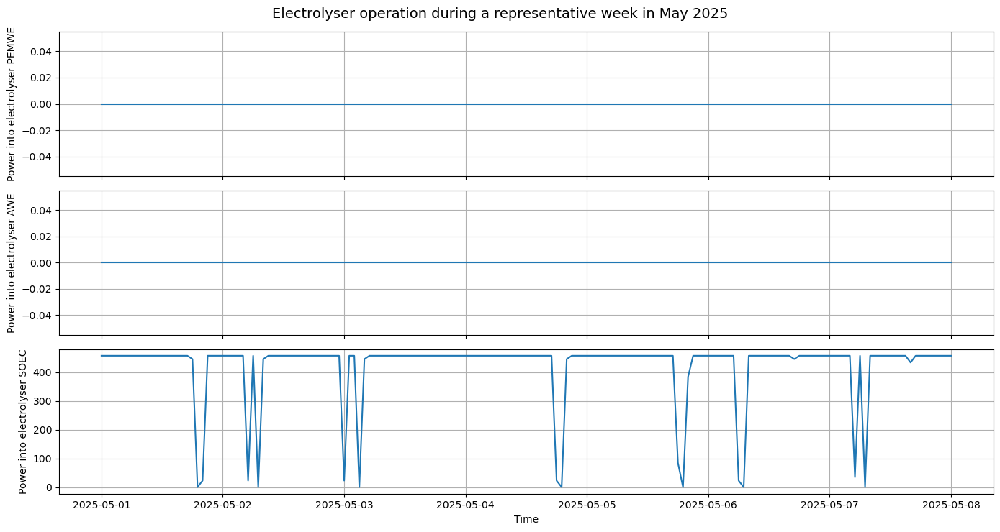

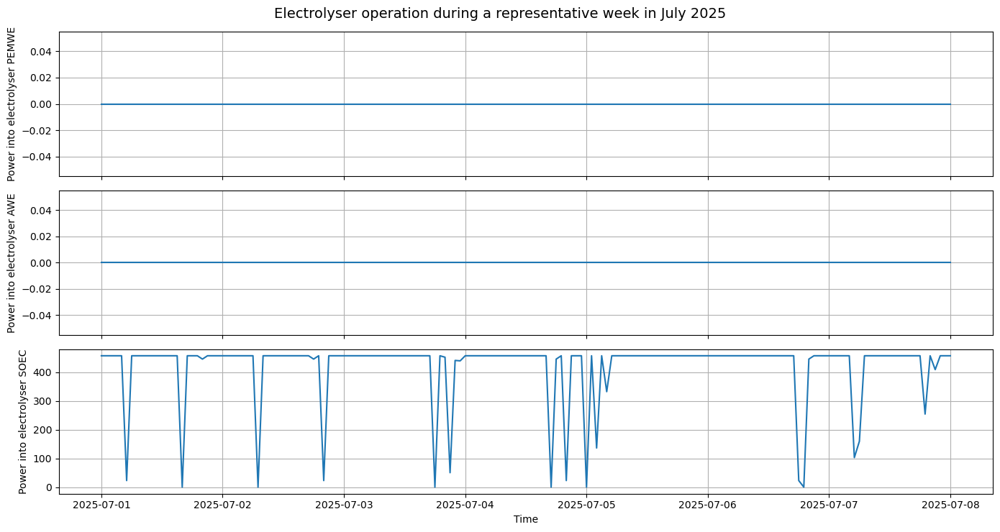

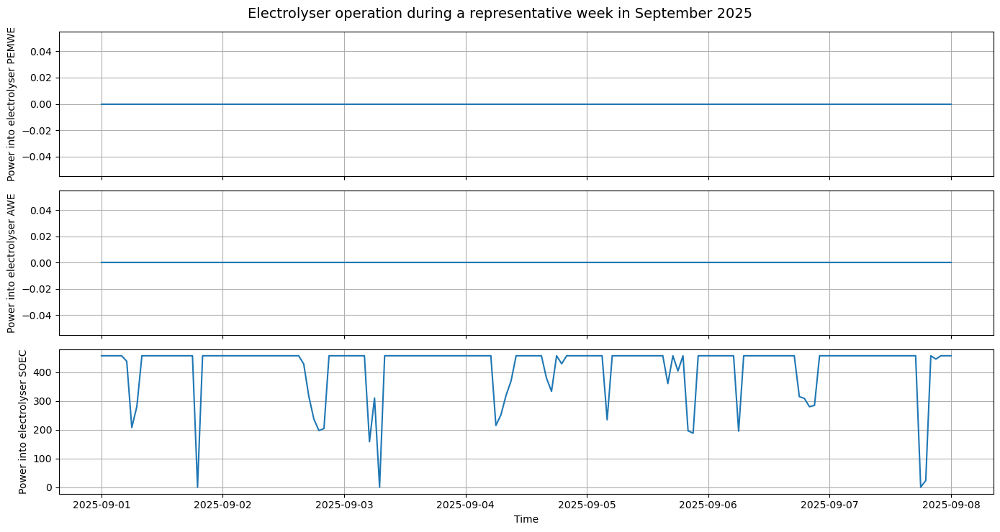

...

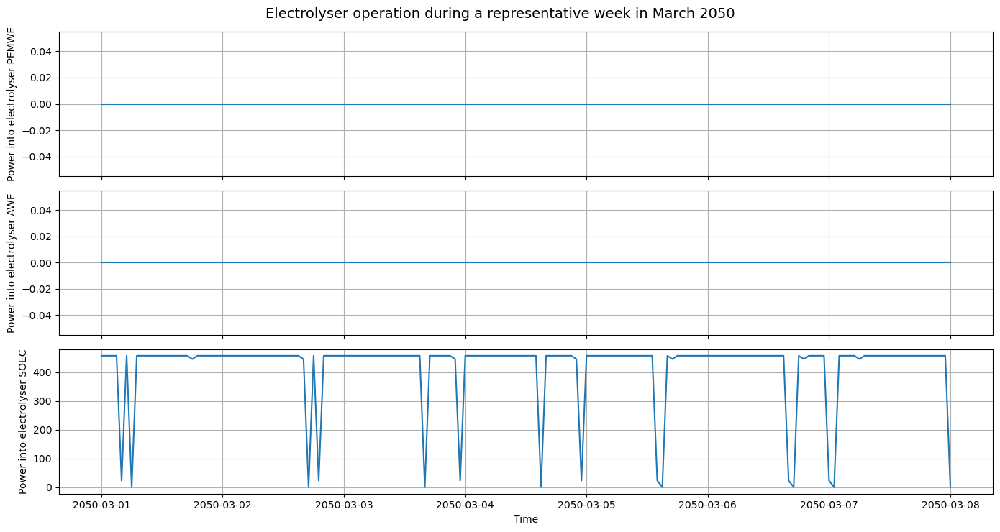

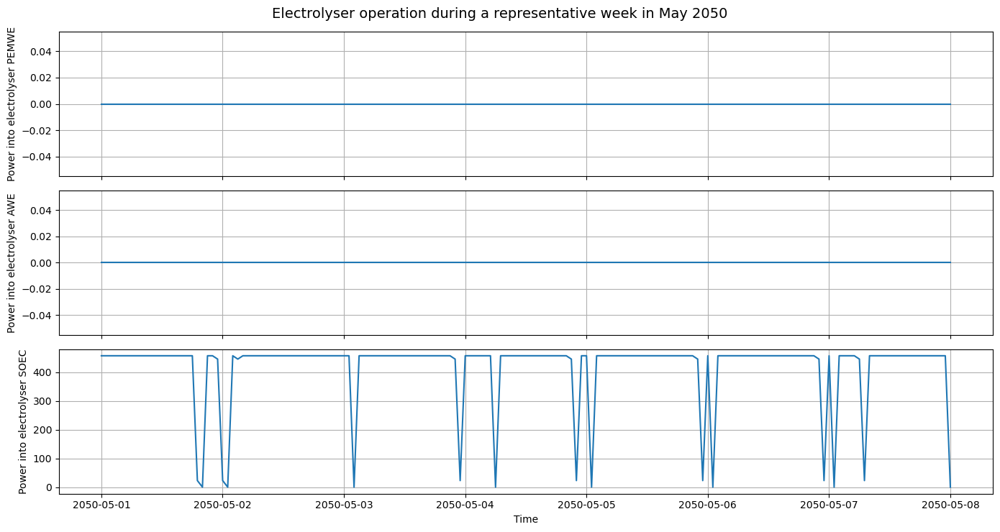

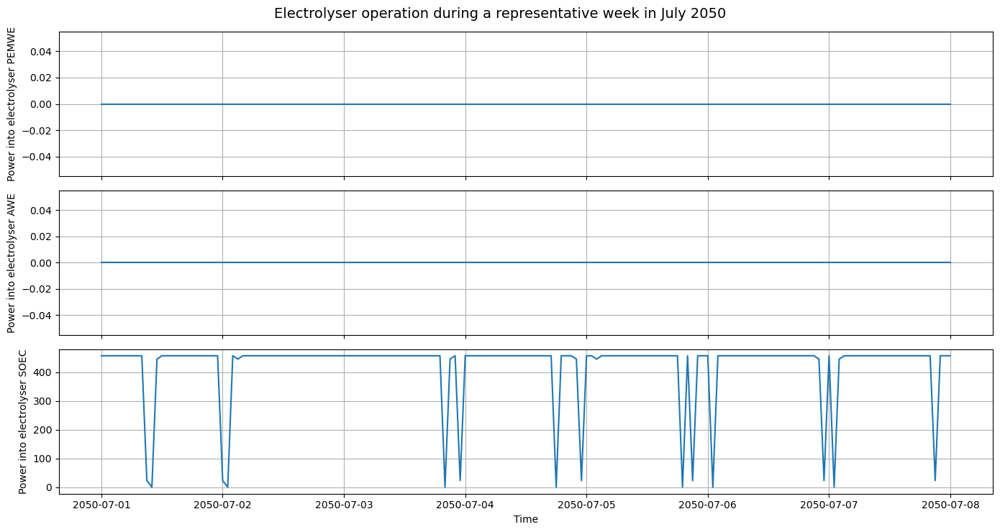

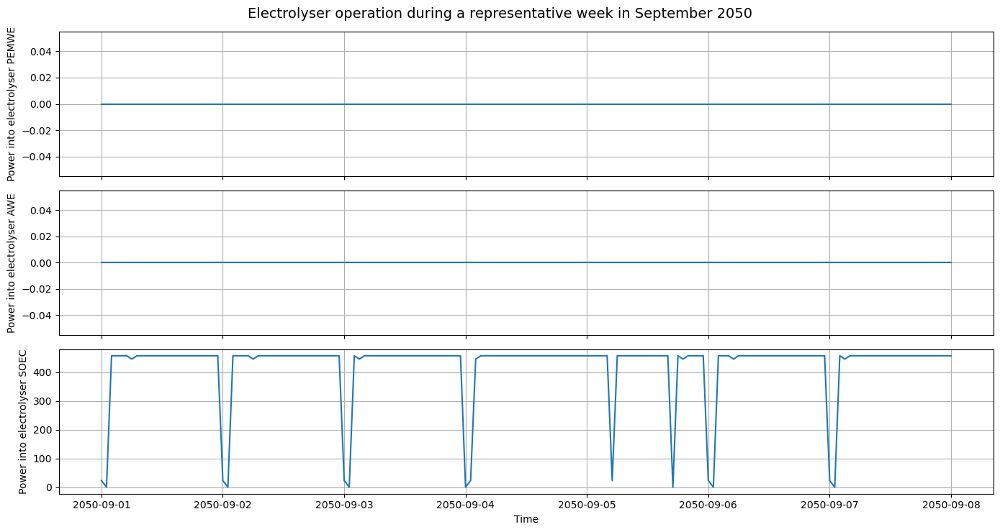

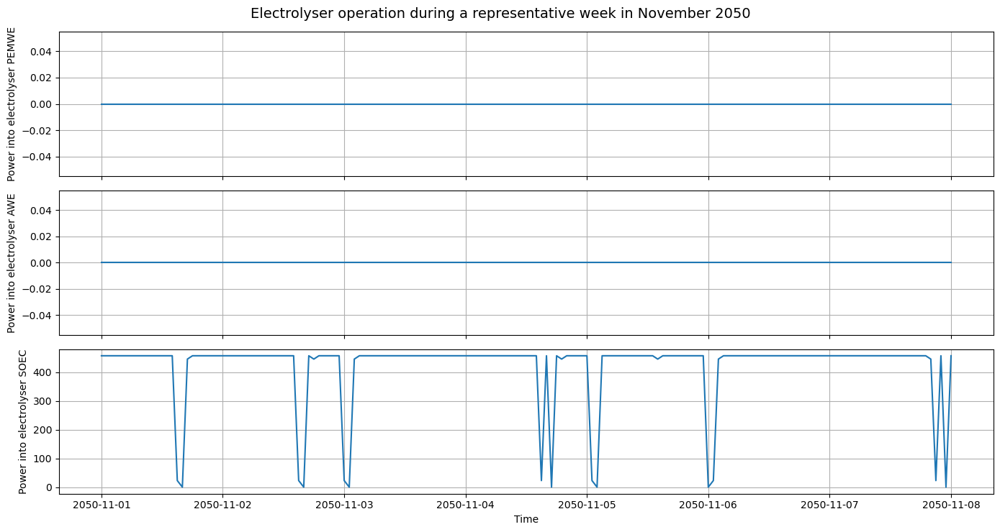

In [9]:
# Finding gamma with planning model
year_set = [2025,2030,2035,2040,2045,2050]
month_set = [1,3,5,7,9,11]
new_gamma1, proportion_of_hours_on_each_week1,P_Ez_sol1, P_Bat_in_sol1, P_Bat_out_sol1 = find_gamma(year_set,month_set,P_PPA,df_Grid, df_Elctro, df_Elctro_Costs,df_Battery,df_PPA,Demand,DemandCycle='Daily',GreenLimit='Weekly',df_lifetime=df_lifetime,df_rep_costs=df_2MW,PPA_sol = PPA_sol_2025, Ez_cap_sol=Ez_cap_sol_2025, Bat_cap_sol=Bat_cap_sol_2025, gamma=0.9,alpha=2,beta=1,Project_Years=26,miprelstop=0.0,maxtime=600000)
print("new gamma:", new_gamma1)

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


FICO Xpress v9.4.2, Hyper, solve started 22:06:33, Aug 8, 2025
Heap usage: 1858MB (peak 1858MB, 55MB system)
Minimizing MILP Hydrogen WoodMac using up to 8 threads and up to 8192MB memory, with these control settings:
MAXTIME = 60000
OUTPUTLOG = 1
MIPRELSTOP = 0
TIMELIMIT = 60000
NLPPOSTSOLVE = 1
XSLP_DELETIONCONTROL = 0
XSLP_OBJSENSE = 1
Original problem has:
   4341032 rows      2506958 cols      9942748 elements         3 entities
Presolved problem has:
   1677663 rows      1118939 cols      4707344 elements         3 entities
LP relaxation tightened
Presolve finished in 175 seconds
Heap usage: 2363MB (peak 4263MB, 55MB system)

Coefficient range                    original                 solved        
  Coefficients   [min,max] : [ 6.08e-09,  1.78e+11] / [ 1.12e-03,  5.14e+01]
  RHS and bounds [min,max] : [ 1.00e+00,  2.35e+02] / [ 1.00e+00,  2.15e+09]
  Objective      [min,max] : [ 1.13e-10,  1.96e+09] / [ 1.69e-10,  9.98e-01]
Autoscaling applied Curtis-Reid scaling

Will try to

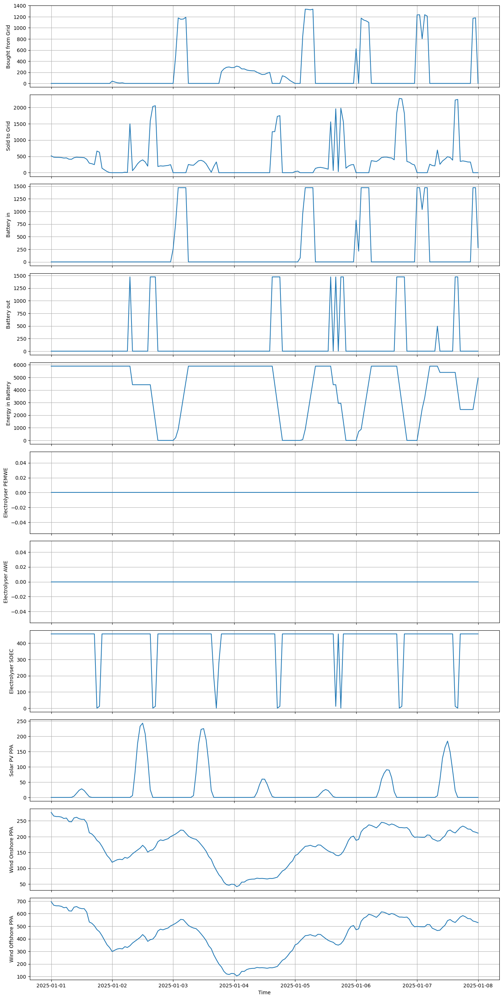

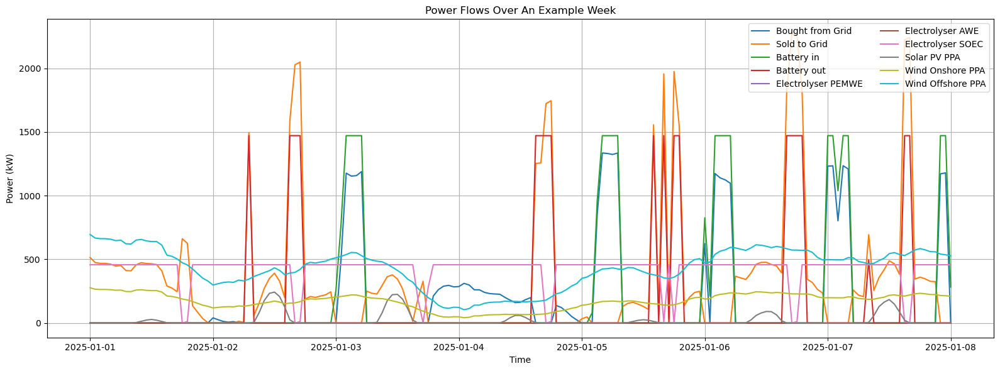

In [10]:
# Planning model with new gamma
PPA_sol_2025_2, Ez_cap_sol_2025_2, Bat_cap_sol_2025_2, P_Ez_sol_2025_2, P_Bat_in_sol_2025_2, P_Bat_out_sol_2025_2, Av_hr_yr_P_Ez_sol_2025_2, Av_hr_yr_P_Bat_in_sol_2025_2, Av_hr_yr_P_Bat_out_sol_2025_2 = planning_model(P_PPA,df_Grid, df_Elctro, df_Elctro_Costs, df_Battery, df_PPA, Demand, DemandCycle='Daily', GreenLimit='Weekly',  df_lifetime= df_lifetime, df_rep_costs= df_2MW, gamma=new_gamma1, alpha=2, beta=1, delta1=1, delta2=1, delta3=1, target_year =2025, target_month = 1,Project_Years = 26, miprelstop = 0.0, maxtime = 60000)

     Report_Year  Report_Month  Report_Day  Report_Hour  \
0           2025             1           1            1   
1           2025             1           1            2   
2           2025             1           1            3   
3           2025             1           1            4   
4           2025             1           1            5   
..           ...           ...         ...          ...   
235         2025             1          10           20   
236         2025             1          10           21   
237         2025             1          10           22   
238         2025             1          10           23   
239         2025             1          10           24   

     Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
0                    0.067262                     0.04432  
1                    0.066458                     0.04545  
2                    0.066458                     0.04566  
3                    0.066458                     0

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
1416         2025             3           1            1   
1417         2025             3           1            2   
1418         2025             3           1            3   
1419         2025             3           1            4   
1420         2025             3           1            5   
...           ...           ...         ...          ...   
1651         2025             3          10           20   
1652         2025             3          10           21   
1653         2025             3          10           22   
1654         2025             3          10           23   
1655         2025             3          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
1416                  0.015903                     0.02391  
1417                  0.015903                     0.02358  
1418                  0.015903                     0.02337  
1419                  0.015903     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
2880         2025             5           1            1   
2881         2025             5           1            2   
2882         2025             5           1            3   
2883         2025             5           1            4   
2884         2025             5           1            5   
...           ...           ...         ...          ...   
3115         2025             5          10           20   
3116         2025             5          10           21   
3117         2025             5          10           22   
3118         2025             5          10           23   
3119         2025             5          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
2880                  0.045477                     0.01827  
2881                  0.046263                     0.02522  
2882                  0.045477                     0.01885  
2883                  0.055591     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
4344         2025             7           1            1   
4345         2025             7           1            2   
4346         2025             7           1            3   
4347         2025             7           1            4   
4348         2025             7           1            5   
...           ...           ...         ...          ...   
4579         2025             7          10           20   
4580         2025             7          10           21   
4581         2025             7          10           22   
4582         2025             7          10           23   
4583         2025             7          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
4344                  0.056951                     0.01932  
4345                  0.056951                     0.01907  
4346                  0.056951                     0.01932  
4347                  0.056951     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
5832         2025             9           1            1   
5833         2025             9           1            2   
5834         2025             9           1            3   
5835         2025             9           1            4   
5836         2025             9           1            5   
...           ...           ...         ...          ...   
6067         2025             9          10           20   
6068         2025             9          10           21   
6069         2025             9          10           22   
6070         2025             9          10           23   
6071         2025             9          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
5832                  0.071810                     0.19286  
5833                  0.071810                     0.19488  
5834                  0.071810                     0.19147  
5835                  0.071810     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
7296         2025            11           1            1   
7297         2025            11           1            2   
7298         2025            11           1            3   
7299         2025            11           1            4   
7300         2025            11           1            5   
...           ...           ...         ...          ...   
7531         2025            11          10           20   
7532         2025            11          10           21   
7533         2025            11          10           22   
7534         2025            11          10           23   
7535         2025            11          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
7296                  0.065056                     0.14131  
7297                  0.066903                     0.14722  
7298                  0.065056                     0.14771  
7299                  0.065056     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
43824         2030             1           1            1   
43825         2030             1           1            2   
43826         2030             1           1            3   
43827         2030             1           1            4   
43828         2030             1           1            5   
...            ...           ...         ...          ...   
44059         2030             1          10           20   
44060         2030             1          10           21   
44061         2030             1          10           22   
44062         2030             1          10           23   
44063         2030             1          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
43824                  0.000205                     0.01098  
43825                  0.000205                     0.01100  
43826                  0.000205                     0.01110  
43827              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
45240         2030             3           1            1   
45241         2030             3           1            2   
45242         2030             3           1            3   
45243         2030             3           1            4   
45244         2030             3           1            5   
...            ...           ...         ...          ...   
45475         2030             3          10           20   
45476         2030             3          10           21   
45477         2030             3          10           22   
45478         2030             3          10           23   
45479         2030             3          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
45240                  0.000205                     0.01189  
45241                  0.000205                     0.01178  
45242                  0.000205                     0.01191  
45243              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
46704         2030             5           1            1   
46705         2030             5           1            2   
46706         2030             5           1            3   
46707         2030             5           1            4   
46708         2030             5           1            5   
...            ...           ...         ...          ...   
46939         2030             5          10           20   
46940         2030             5          10           21   
46941         2030             5          10           22   
46942         2030             5          10           23   
46943         2030             5          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
46704                  0.007883                     0.00954  
46705                  0.007883                     0.01466  
46706                  0.007883                     0.00970  
46707              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
48168         2030             7           1            1   
48169         2030             7           1            2   
48170         2030             7           1            3   
48171         2030             7           1            4   
48172         2030             7           1            5   
...            ...           ...         ...          ...   
48403         2030             7          10           20   
48404         2030             7          10           21   
48405         2030             7          10           22   
48406         2030             7          10           23   
48407         2030             7          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
48168                  0.000282                     0.00998  
48169                  0.000205                     0.00976  
48170                  0.000205                     0.00998  
48171              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
49656         2030             9           1            1   
49657         2030             9           1            2   
49658         2030             9           1            3   
49659         2030             9           1            4   
49660         2030             9           1            5   
...            ...           ...         ...          ...   
49891         2030             9          10           20   
49892         2030             9          10           21   
49893         2030             9          10           22   
49894         2030             9          10           23   
49895         2030             9          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
49656                  0.076376                     0.22211  
49657                  0.075025                     0.21208  
49658                  0.075025                     0.20896  
49659              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
51120         2030            11           1            1   
51121         2030            11           1            2   
51122         2030            11           1            3   
51123         2030            11           1            4   
51124         2030            11           1            5   
...            ...           ...         ...          ...   
51355         2030            11          10           20   
51356         2030            11          10           21   
51357         2030            11          10           22   
51358         2030            11          10           23   
51359         2030            11          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
51120                  0.073939                     0.08641  
51121                  0.074333                     0.11636  
51122                  0.074162                     0.12082  
51123              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
87648         2035             1           1            1   
87649         2035             1           1            2   
87650         2035             1           1            3   
87651         2035             1           1            4   
87652         2035             1           1            5   
...            ...           ...         ...          ...   
87883         2035             1          10           20   
87884         2035             1          10           21   
87885         2035             1          10           22   
87886         2035             1          10           23   
87887         2035             1          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
87648                  0.000556                    -0.00139  
87649                  0.000205                    -0.00138  
87650                  0.000556                    -0.00114  
87651              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
89064         2035             3           1            1   
89065         2035             3           1            2   
89066         2035             3           1            3   
89067         2035             3           1            4   
89068         2035             3           1            5   
...            ...           ...         ...          ...   
89299         2035             3          10           20   
89300         2035             3          10           21   
89301         2035             3          10           22   
89302         2035             3          10           23   
89303         2035             3          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
89064                  0.000205                    -0.00255  
89065                  0.000205                    -0.00269  
89066                  0.000205                    -0.00283  
89067              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
90528         2035             5           1            1   
90529         2035             5           1            2   
90530         2035             5           1            3   
90531         2035             5           1            4   
90532         2035             5           1            5   
...            ...           ...         ...          ...   
90763         2035             5          10           20   
90764         2035             5          10           21   
90765         2035             5          10           22   
90766         2035             5          10           23   
90767         2035             5          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
90528                  0.000205                    -0.00278  
90529                  0.000205                    -0.00300  
90530                  0.000205                    -0.00288  
90531              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
91992         2035             7           1            1   
91993         2035             7           1            2   
91994         2035             7           1            3   
91995         2035             7           1            4   
91996         2035             7           1            5   
...            ...           ...         ...          ...   
92227         2035             7          10           20   
92228         2035             7          10           21   
92229         2035             7          10           22   
92230         2035             7          10           23   
92231         2035             7          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
91992                  0.000205                    -0.00324  
91993                  0.000205                    -0.00327  
91994                  0.000205                    -0.00328  
91995              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
93480         2035             9           1            1   
93481         2035             9           1            2   
93482         2035             9           1            3   
93483         2035             9           1            4   
93484         2035             9           1            5   
...            ...           ...         ...          ...   
93715         2035             9          10           20   
93716         2035             9          10           21   
93717         2035             9          10           22   
93718         2035             9          10           23   
93719         2035             9          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
93480                  0.091142                     0.07922  
93481                  0.091142                     0.07720  
93482                  0.091142                     0.07606  
93483              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
94944         2035            11           1            1   
94945         2035            11           1            2   
94946         2035            11           1            3   
94947         2035            11           1            4   
94948         2035            11           1            5   
...            ...           ...         ...          ...   
95179         2035            11          10           20   
95180         2035            11          10           21   
95181         2035            11          10           22   
95182         2035            11          10           23   
95183         2035            11          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
94944                  0.092886                     0.01737  
94945                  0.092886                     0.02715  
94946                  0.092886                     0.02863  
94947              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
131472         2040             1           1            1   
131473         2040             1           1            2   
131474         2040             1           1            3   
131475         2040             1           1            4   
131476         2040             1           1            5   
...             ...           ...         ...          ...   
131707         2040             1          10           20   
131708         2040             1          10           21   
131709         2040             1          10           22   
131710         2040             1          10           23   
131711         2040             1          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
131472                  0.002642                    -0.00418  
131473                  0.002291                    -0.00396  
131474                  0.002642                    -0.00367  
131

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
132912         2040             3           1            1   
132913         2040             3           1            2   
132914         2040             3           1            3   
132915         2040             3           1            4   
132916         2040             3           1            5   
...             ...           ...         ...          ...   
133147         2040             3          10           20   
133148         2040             3          10           21   
133149         2040             3          10           22   
133150         2040             3          10           23   
133151         2040             3          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
132912                  0.000205                    -0.00260  
132913                  0.000205                    -0.00214  
132914                  0.000205                    -0.00272  
132

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
134376         2040             5           1            1   
134377         2040             5           1            2   
134378         2040             5           1            3   
134379         2040             5           1            4   
134380         2040             5           1            5   
...             ...           ...         ...          ...   
134611         2040             5          10           20   
134612         2040             5          10           21   
134613         2040             5          10           22   
134614         2040             5          10           23   
134615         2040             5          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
134376                  0.000205                    -0.00258  
134377                  0.000633                    -0.00534  
134378                  0.000205                    -0.00271  
134

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
135840         2040             7           1            1   
135841         2040             7           1            2   
135842         2040             7           1            3   
135843         2040             7           1            4   
135844         2040             7           1            5   
...             ...           ...         ...          ...   
136075         2040             7          10           20   
136076         2040             7          10           21   
136077         2040             7          10           22   
136078         2040             7          10           23   
136079         2040             7          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
135840                  0.000205                    -0.00395  
135841                  0.000205                    -0.00322  
135842                  0.000556                    -0.00417  
135

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/x_FinalModel.py:1013: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(len(plot_df.columns), 1, figsize=(14, 2.5 * len(plot_df.columns)), sharex=True)
/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
137328         2040             9           1            1   
137329         2040             9           1            2   
137330         2040             9           1            3   
137331         2040             9           1            4   
137332         2040             9           1            5   
...             ...           ...         ...          ...   
137563         2040             9          10           20   
137564         2040             9          10           21   
137565         2040             9          10           22   
137566         2040             9          10           23   
137567         2040             9          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
137328                  0.102684                     0.05570  
137329                  0.102684                     0.05539  
137330                  0.102684                     0.05607  
137

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
138792         2040            11           1            1   
138793         2040            11           1            2   
138794         2040            11           1            3   
138795         2040            11           1            4   
138796         2040            11           1            5   
...             ...           ...         ...          ...   
139027         2040            11          10           20   
139028         2040            11          10           21   
139029         2040            11          10           22   
139030         2040            11          10           23   
139031         2040            11          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
138792                  0.112474                     0.03641  
138793                  0.104112                     0.02979  
138794                  0.102607                     0.02843  
138

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
175320         2045             1           1            1   
175321         2045             1           1            2   
175322         2045             1           1            3   
175323         2045             1           1            4   
175324         2045             1           1            5   
...             ...           ...         ...          ...   
175555         2045             1          10           20   
175556         2045             1          10           21   
175557         2045             1          10           22   
175558         2045             1          10           23   
175559         2045             1          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
175320                  0.004378                    -0.00477  
175321                  0.004378                    -0.00529  
175322                  0.004378                    -0.00569  
175

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
176736         2045             3           1            1   
176737         2045             3           1            2   
176738         2045             3           1            3   
176739         2045             3           1            4   
176740         2045             3           1            5   
...             ...           ...         ...          ...   
176971         2045             3          10           20   
176972         2045             3          10           21   
176973         2045             3          10           22   
176974         2045             3          10           23   
176975         2045             3          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
176736                  0.000205                    -0.00449  
176737                  0.000205                    -0.00433  
176738                  0.000205                    -0.00497  
176

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
178200         2045             5           1            1   
178201         2045             5           1            2   
178202         2045             5           1            3   
178203         2045             5           1            4   
178204         2045             5           1            5   
...             ...           ...         ...          ...   
178435         2045             5          10           20   
178436         2045             5          10           21   
178437         2045             5          10           22   
178438         2045             5          10           23   
178439         2045             5          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
178200                  0.000205                    -0.00361  
178201                 -0.001821                    -0.00673  
178202                  0.000205                    -0.00356  
178

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
179664         2045             7           1            1   
179665         2045             7           1            2   
179666         2045             7           1            3   
179667         2045             7           1            4   
179668         2045             7           1            5   
...             ...           ...         ...          ...   
179899         2045             7          10           20   
179900         2045             7          10           21   
179901         2045             7          10           22   
179902         2045             7          10           23   
179903         2045             7          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
179664                  0.000205                    -0.00562  
179665                  0.000205                    -0.00522  
179666                  0.000205                    -0.00582  
179

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
181152         2045             9           1            1   
181153         2045             9           1            2   
181154         2045             9           1            3   
181155         2045             9           1            4   
181156         2045             9           1            5   
...             ...           ...         ...          ...   
181387         2045             9          10           20   
181388         2045             9          10           21   
181389         2045             9          10           22   
181390         2045             9          10           23   
181391         2045             9          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
181152                  0.119818                     0.04178  
181153                  0.119818                     0.04311  
181154                  0.119818                     0.04191  
181

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
182616         2045            11           1            1   
182617         2045            11           1            2   
182618         2045            11           1            3   
182619         2045            11           1            4   
182620         2045            11           1            5   
...             ...           ...         ...          ...   
182851         2045            11          10           20   
182852         2045            11          10           21   
182853         2045            11          10           22   
182854         2045            11          10           23   
182855         2045            11          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
182616                  0.120767                     0.01687  
182617                  0.120767                     0.02751  
182618                  0.120767                     0.03490  
182

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
219144         2050             1           1            1   
219145         2050             1           1            2   
219146         2050             1           1            3   
219147         2050             1           1            4   
219148         2050             1           1            5   
...             ...           ...         ...          ...   
219379         2050             1          10           20   
219380         2050             1          10           21   
219381         2050             1          10           22   
219382         2050             1          10           23   
219383         2050             1          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
219144                  0.006626                    -0.00644  
219145                  0.006481                    -0.00671  
219146                  0.006481                    -0.00653  
219

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
220560         2050             3           1            1   
220561         2050             3           1            2   
220562         2050             3           1            3   
220563         2050             3           1            4   
220564         2050             3           1            5   
...             ...           ...         ...          ...   
220795         2050             3          10           20   
220796         2050             3          10           21   
220797         2050             3          10           22   
220798         2050             3          10           23   
220799         2050             3          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
220560                  0.000205                    -0.00472  
220561                  0.000205                    -0.00454  
220562                  0.000205                    -0.00542  
220

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
222024         2050             5           1            1   
222025         2050             5           1            2   
222026         2050             5           1            3   
222027         2050             5           1            4   
222028         2050             5           1            5   
...             ...           ...         ...          ...   
222259         2050             5          10           20   
222260         2050             5          10           21   
222261         2050             5          10           22   
222262         2050             5          10           23   
222263         2050             5          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
222024                  0.000205                    -0.00359  
222025                  0.000333                    -0.00509  
222026                  0.000205                    -0.00385  
222

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
223488         2050             7           1            1   
223489         2050             7           1            2   
223490         2050             7           1            3   
223491         2050             7           1            4   
223492         2050             7           1            5   
...             ...           ...         ...          ...   
223723         2050             7          10           20   
223724         2050             7          10           21   
223725         2050             7          10           22   
223726         2050             7          10           23   
223727         2050             7          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
223488                  0.000205                    -0.00508  
223489                  0.000205                    -0.00400  
223490                  0.000205                    -0.00527  
223

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
224976         2050             9           1            1   
224977         2050             9           1            2   
224978         2050             9           1            3   
224979         2050             9           1            4   
224980         2050             9           1            5   
...             ...           ...         ...          ...   
225211         2050             9          10           20   
225212         2050             9          10           21   
225213         2050             9          10           22   
225214         2050             9          10           23   
225215         2050             9          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
224976                  0.152136                     0.03433  
224977                  0.152136                     0.03289  
224978                  0.152136                     0.03222  
224

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
226440         2050            11           1            1   
226441         2050            11           1            2   
226442         2050            11           1            3   
226443         2050            11           1            4   
226444         2050            11           1            5   
...             ...           ...         ...          ...   
226675         2050            11          10           20   
226676         2050            11          10           21   
226677         2050            11          10           22   
226678         2050            11          10           23   
226679         2050            11          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
226440                  0.126179                     0.01181  
226441                  0.122528                     0.01352  
226442                  0.126179                     0.01730  
226

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)
/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


new gamma: 0.9593750000000002


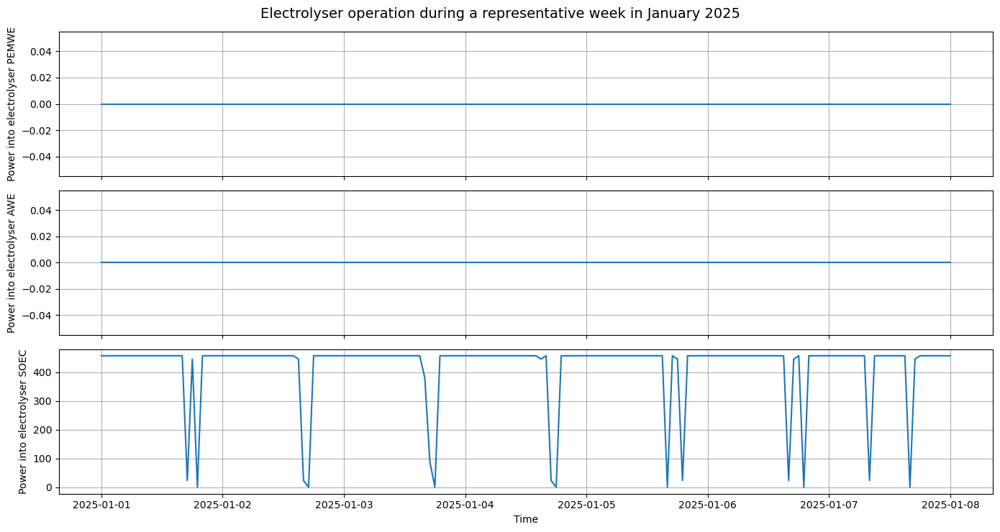

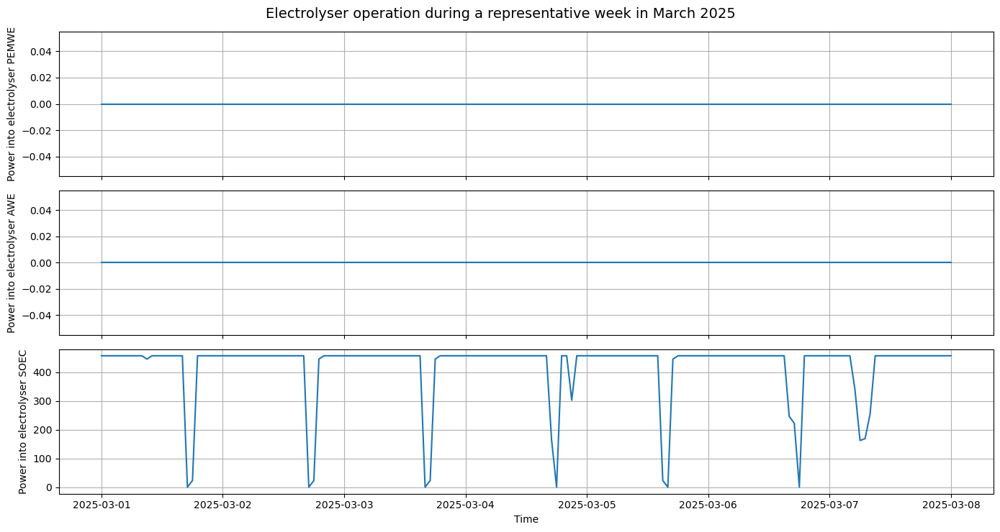

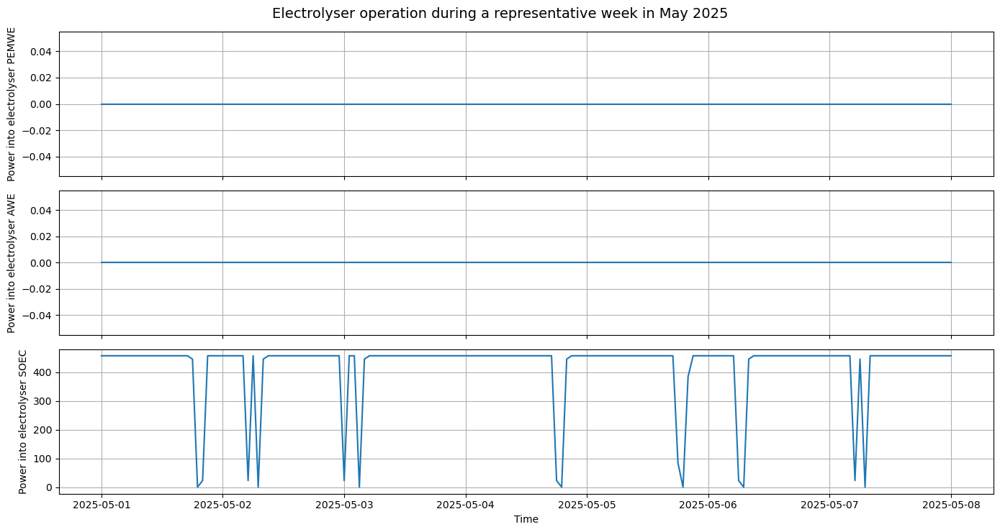

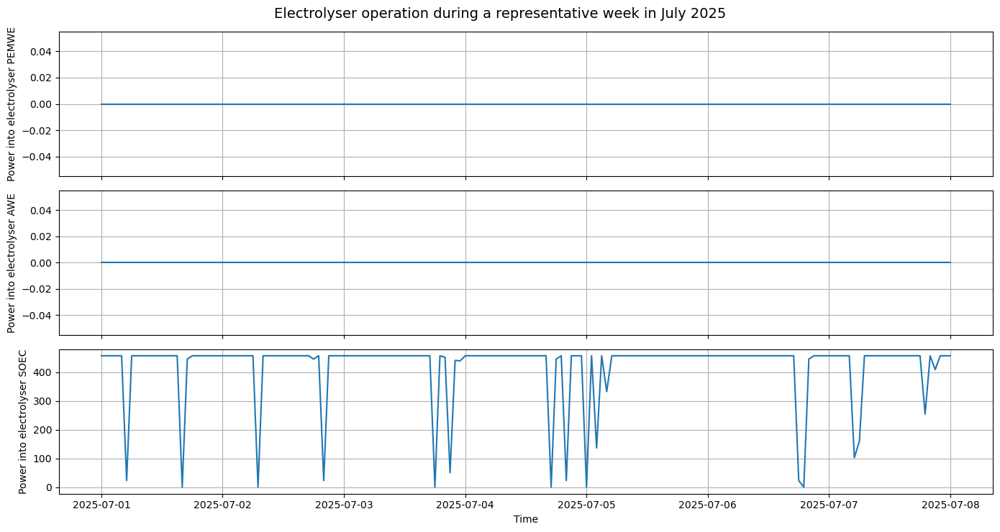

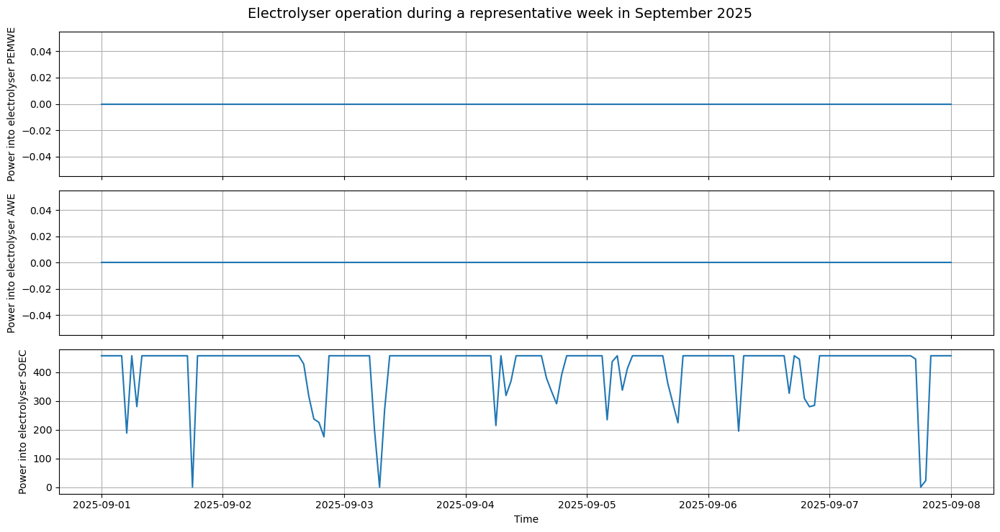

...

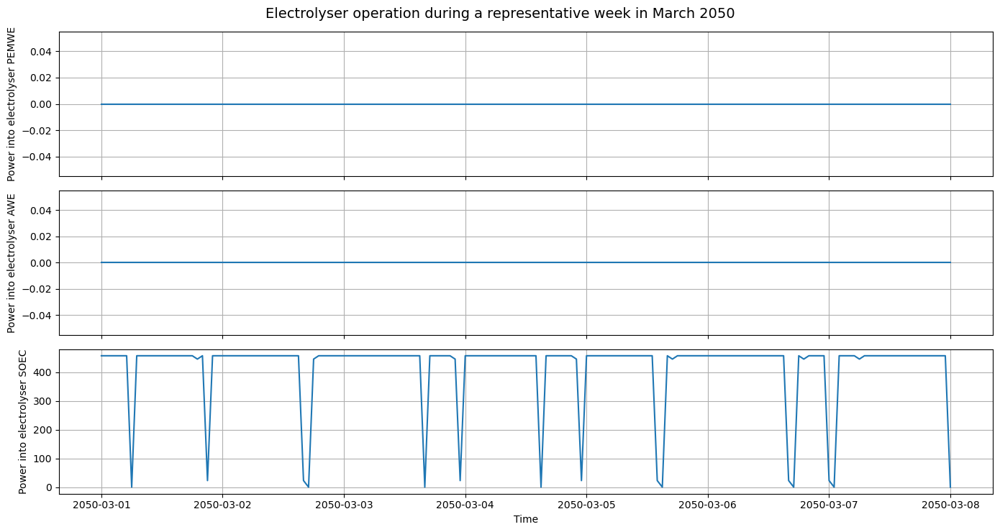

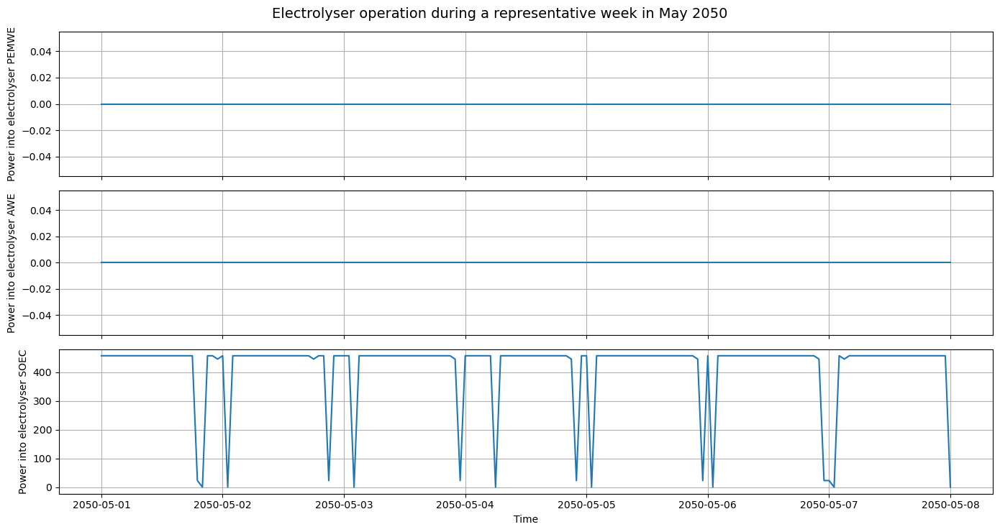

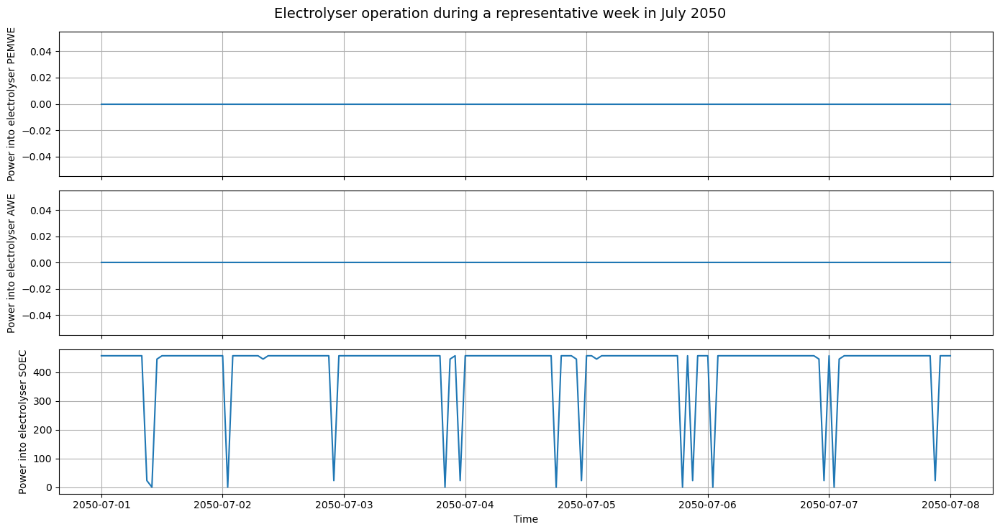

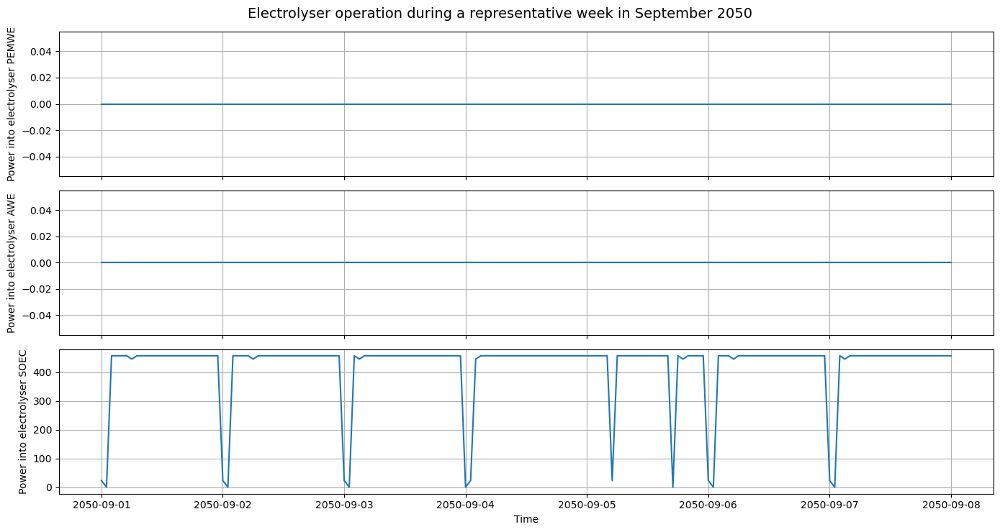

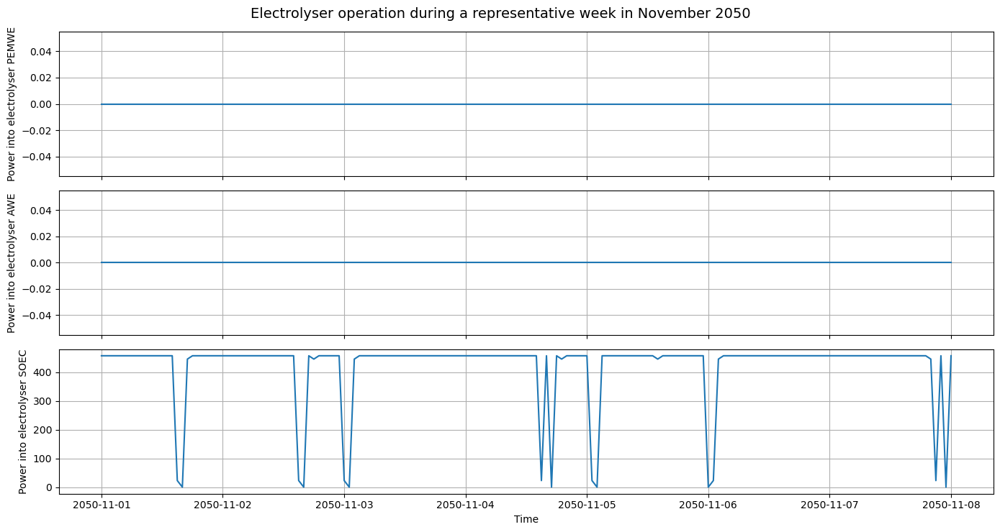

In [11]:
# Find gamma with second planning model
year_set = [2025,2030,2035,2040,2045,2050]
month_set = [1,3,5,7,9,11]
new_gamma2, proportion_of_hours_on_each_week2,P_Ez_sol2, P_Bat_in_sol2, P_Bat_out_sol2 = find_gamma(year_set,month_set,P_PPA,df_Grid, df_Elctro, df_Elctro_Costs,df_Battery,df_PPA,Demand,DemandCycle='Daily',GreenLimit='Weekly',df_lifetime=df_lifetime,df_rep_costs=df_2MW,PPA_sol = PPA_sol_2025_2, Ez_cap_sol=Ez_cap_sol_2025_2, Bat_cap_sol=Bat_cap_sol_2025_2, gamma=new_gamma1,alpha=2,beta=1,Project_Years=26,miprelstop=0.0,maxtime=600000)
print("new gamma:", new_gamma2)

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


FICO Xpress v9.4.2, Hyper, solve started 22:43:27, Aug 8, 2025
Heap usage: 1858MB (peak 1858MB, 55MB system)
Minimizing MILP Hydrogen WoodMac using up to 8 threads and up to 8192MB memory, with these control settings:
MAXTIME = 60000
OUTPUTLOG = 1
MIPRELSTOP = 0
TIMELIMIT = 60000
NLPPOSTSOLVE = 1
XSLP_DELETIONCONTROL = 0
XSLP_OBJSENSE = 1
Original problem has:
   4341032 rows      2506958 cols      9942748 elements         3 entities
Presolved problem has:
   1677663 rows      1118939 cols      4707344 elements         3 entities
LP relaxation tightened
Presolve finished in 177 seconds
Heap usage: 2363MB (peak 4263MB, 55MB system)

Coefficient range                    original                 solved        
  Coefficients   [min,max] : [ 6.08e-09,  1.78e+11] / [ 1.12e-03,  5.14e+01]
  RHS and bounds [min,max] : [ 1.00e+00,  2.35e+02] / [ 1.00e+00,  2.15e+09]
  Objective      [min,max] : [ 1.13e-10,  1.96e+09] / [ 1.69e-10,  9.98e-01]
Autoscaling applied Curtis-Reid scaling

Will try to

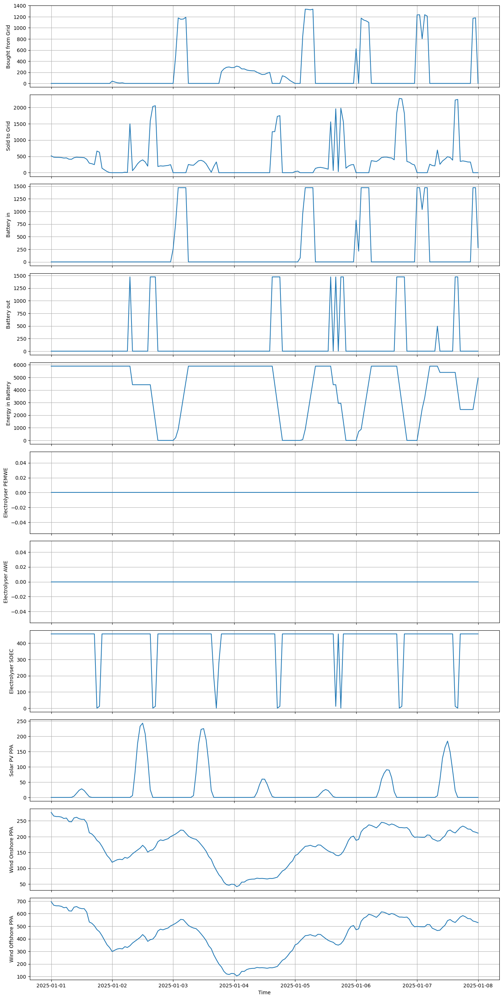

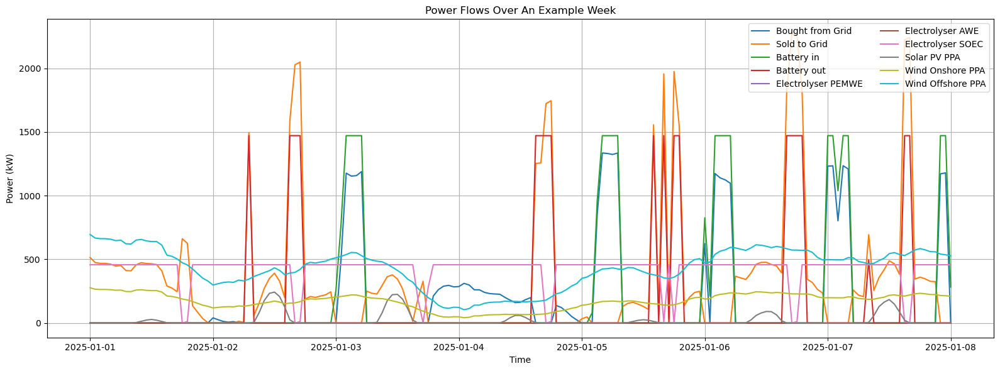

In [12]:
PPA_sol_2025_3, Ez_cap_sol_2025_3, Bat_cap_sol_2025_3, P_Ez_sol_2025_3, P_Bat_in_sol_2025_3, P_Bat_out_sol_2025_3, Av_hr_yr_P_Ez_sol_2025_3, Av_hr_yr_P_Bat_in_sol_2025_3, Av_hr_yr_P_Bat_out_sol_2025_3 = planning_model(P_PPA,df_Grid, df_Elctro, df_Elctro_Costs, df_Battery, df_PPA, Demand, DemandCycle='Daily', GreenLimit='Weekly',  df_lifetime= df_lifetime, df_rep_costs= df_2MW, gamma=new_gamma2, alpha=2, beta=1, delta1=1, delta2=1, delta3=1, target_year =2025, target_month = 1,Project_Years = 26, miprelstop = 0.0, maxtime = 60000)

     Report_Year  Report_Month  Report_Day  Report_Hour  \
0           2025             1           1            1   
1           2025             1           1            2   
2           2025             1           1            3   
3           2025             1           1            4   
4           2025             1           1            5   
..           ...           ...         ...          ...   
235         2025             1          10           20   
236         2025             1          10           21   
237         2025             1          10           22   
238         2025             1          10           23   
239         2025             1          10           24   

     Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
0                    0.067262                     0.04432  
1                    0.066458                     0.04545  
2                    0.066458                     0.04566  
3                    0.066458                     0

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
1416         2025             3           1            1   
1417         2025             3           1            2   
1418         2025             3           1            3   
1419         2025             3           1            4   
1420         2025             3           1            5   
...           ...           ...         ...          ...   
1651         2025             3          10           20   
1652         2025             3          10           21   
1653         2025             3          10           22   
1654         2025             3          10           23   
1655         2025             3          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
1416                  0.015903                     0.02391  
1417                  0.015903                     0.02358  
1418                  0.015903                     0.02337  
1419                  0.015903     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
2880         2025             5           1            1   
2881         2025             5           1            2   
2882         2025             5           1            3   
2883         2025             5           1            4   
2884         2025             5           1            5   
...           ...           ...         ...          ...   
3115         2025             5          10           20   
3116         2025             5          10           21   
3117         2025             5          10           22   
3118         2025             5          10           23   
3119         2025             5          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
2880                  0.045477                     0.01827  
2881                  0.046263                     0.02522  
2882                  0.045477                     0.01885  
2883                  0.055591     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
4344         2025             7           1            1   
4345         2025             7           1            2   
4346         2025             7           1            3   
4347         2025             7           1            4   
4348         2025             7           1            5   
...           ...           ...         ...          ...   
4579         2025             7          10           20   
4580         2025             7          10           21   
4581         2025             7          10           22   
4582         2025             7          10           23   
4583         2025             7          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
4344                  0.056951                     0.01932  
4345                  0.056951                     0.01907  
4346                  0.056951                     0.01932  
4347                  0.056951     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
5832         2025             9           1            1   
5833         2025             9           1            2   
5834         2025             9           1            3   
5835         2025             9           1            4   
5836         2025             9           1            5   
...           ...           ...         ...          ...   
6067         2025             9          10           20   
6068         2025             9          10           21   
6069         2025             9          10           22   
6070         2025             9          10           23   
6071         2025             9          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
5832                  0.071810                     0.19286  
5833                  0.071810                     0.19488  
5834                  0.071810                     0.19147  
5835                  0.071810     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


      Report_Year  Report_Month  Report_Day  Report_Hour  \
7296         2025            11           1            1   
7297         2025            11           1            2   
7298         2025            11           1            3   
7299         2025            11           1            4   
7300         2025            11           1            5   
...           ...           ...         ...          ...   
7531         2025            11          10           20   
7532         2025            11          10           21   
7533         2025            11          10           22   
7534         2025            11          10           23   
7535         2025            11          10           24   

      Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
7296                  0.065056                     0.14131  
7297                  0.066903                     0.14722  
7298                  0.065056                     0.14771  
7299                  0.065056     

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
43824         2030             1           1            1   
43825         2030             1           1            2   
43826         2030             1           1            3   
43827         2030             1           1            4   
43828         2030             1           1            5   
...            ...           ...         ...          ...   
44059         2030             1          10           20   
44060         2030             1          10           21   
44061         2030             1          10           22   
44062         2030             1          10           23   
44063         2030             1          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
43824                  0.000205                     0.01098  
43825                  0.000205                     0.01100  
43826                  0.000205                     0.01110  
43827              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


LOOK AT THIS DEBUG: 240
THis is length 240
[(2030, 1, 1, 1), (2030, 1, 1, 2), (2030, 1, 1, 3), (2030, 1, 1, 4), (2030, 1, 1, 5), (2030, 1, 1, 6), (2030, 1, 1, 7), (2030, 1, 1, 8), (2030, 1, 1, 9), (2030, 1, 1, 10), (2030, 1, 1, 11), (2030, 1, 1, 12), (2030, 1, 1, 13), (2030, 1, 1, 14), (2030, 1, 1, 15), (2030, 1, 1, 16), (2030, 1, 1, 17), (2030, 1, 1, 18), (2030, 1, 1, 19), (2030, 1, 1, 20), (2030, 1, 1, 21), (2030, 1, 1, 22), (2030, 1, 1, 23), (2030, 1, 1, 24), (2030, 1, 2, 1), (2030, 1, 2, 2), (2030, 1, 2, 3), (2030, 1, 2, 4), (2030, 1, 2, 5), (2030, 1, 2, 6), (2030, 1, 2, 7), (2030, 1, 2, 8), (2030, 1, 2, 9), (2030, 1, 2, 10), (2030, 1, 2, 11), (2030, 1, 2, 12), (2030, 1, 2, 13), (2030, 1, 2, 14), (2030, 1, 2, 15), (2030, 1, 2, 16), (2030, 1, 2, 17), (2030, 1, 2, 18), (2030, 1, 2, 19), (2030, 1, 2, 20), (2030, 1, 2, 21), (2030, 1, 2, 22), (2030, 1, 2, 23), (2030, 1, 2, 24), (2030, 1, 3, 1), (2030, 1, 3, 2), (2030, 1, 3, 3), (2030, 1, 3, 4), (2030, 1, 3, 5), (2030, 1, 3, 6), (2030, 1

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
46704         2030             5           1            1   
46705         2030             5           1            2   
46706         2030             5           1            3   
46707         2030             5           1            4   
46708         2030             5           1            5   
...            ...           ...         ...          ...   
46939         2030             5          10           20   
46940         2030             5          10           21   
46941         2030             5          10           22   
46942         2030             5          10           23   
46943         2030             5          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
46704                  0.007883                     0.00954  
46705                  0.007883                     0.01466  
46706                  0.007883                     0.00970  
46707              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
48168         2030             7           1            1   
48169         2030             7           1            2   
48170         2030             7           1            3   
48171         2030             7           1            4   
48172         2030             7           1            5   
...            ...           ...         ...          ...   
48403         2030             7          10           20   
48404         2030             7          10           21   
48405         2030             7          10           22   
48406         2030             7          10           23   
48407         2030             7          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
48168                  0.000282                     0.00998  
48169                  0.000205                     0.00976  
48170                  0.000205                     0.00998  
48171              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
49656         2030             9           1            1   
49657         2030             9           1            2   
49658         2030             9           1            3   
49659         2030             9           1            4   
49660         2030             9           1            5   
...            ...           ...         ...          ...   
49891         2030             9          10           20   
49892         2030             9          10           21   
49893         2030             9          10           22   
49894         2030             9          10           23   
49895         2030             9          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
49656                  0.076376                     0.22211  
49657                  0.075025                     0.21208  
49658                  0.075025                     0.20896  
49659              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
51120         2030            11           1            1   
51121         2030            11           1            2   
51122         2030            11           1            3   
51123         2030            11           1            4   
51124         2030            11           1            5   
...            ...           ...         ...          ...   
51355         2030            11          10           20   
51356         2030            11          10           21   
51357         2030            11          10           22   
51358         2030            11          10           23   
51359         2030            11          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
51120                  0.073939                     0.08641  
51121                  0.074333                     0.11636  
51122                  0.074162                     0.12082  
51123              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
87648         2035             1           1            1   
87649         2035             1           1            2   
87650         2035             1           1            3   
87651         2035             1           1            4   
87652         2035             1           1            5   
...            ...           ...         ...          ...   
87883         2035             1          10           20   
87884         2035             1          10           21   
87885         2035             1          10           22   
87886         2035             1          10           23   
87887         2035             1          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
87648                  0.000556                    -0.00139  
87649                  0.000205                    -0.00138  
87650                  0.000556                    -0.00114  
87651              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
89064         2035             3           1            1   
89065         2035             3           1            2   
89066         2035             3           1            3   
89067         2035             3           1            4   
89068         2035             3           1            5   
...            ...           ...         ...          ...   
89299         2035             3          10           20   
89300         2035             3          10           21   
89301         2035             3          10           22   
89302         2035             3          10           23   
89303         2035             3          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
89064                  0.000205                    -0.00255  
89065                  0.000205                    -0.00269  
89066                  0.000205                    -0.00283  
89067              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
90528         2035             5           1            1   
90529         2035             5           1            2   
90530         2035             5           1            3   
90531         2035             5           1            4   
90532         2035             5           1            5   
...            ...           ...         ...          ...   
90763         2035             5          10           20   
90764         2035             5          10           21   
90765         2035             5          10           22   
90766         2035             5          10           23   
90767         2035             5          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
90528                  0.000205                    -0.00278  
90529                  0.000205                    -0.00300  
90530                  0.000205                    -0.00288  
90531              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
91992         2035             7           1            1   
91993         2035             7           1            2   
91994         2035             7           1            3   
91995         2035             7           1            4   
91996         2035             7           1            5   
...            ...           ...         ...          ...   
92227         2035             7          10           20   
92228         2035             7          10           21   
92229         2035             7          10           22   
92230         2035             7          10           23   
92231         2035             7          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
91992                  0.000205                    -0.00324  
91993                  0.000205                    -0.00327  
91994                  0.000205                    -0.00328  
91995              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
93480         2035             9           1            1   
93481         2035             9           1            2   
93482         2035             9           1            3   
93483         2035             9           1            4   
93484         2035             9           1            5   
...            ...           ...         ...          ...   
93715         2035             9          10           20   
93716         2035             9          10           21   
93717         2035             9          10           22   
93718         2035             9          10           23   
93719         2035             9          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
93480                  0.091142                     0.07922  
93481                  0.091142                     0.07720  
93482                  0.091142                     0.07606  
93483              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


       Report_Year  Report_Month  Report_Day  Report_Hour  \
94944         2035            11           1            1   
94945         2035            11           1            2   
94946         2035            11           1            3   
94947         2035            11           1            4   
94948         2035            11           1            5   
...            ...           ...         ...          ...   
95179         2035            11          10           20   
95180         2035            11          10           21   
95181         2035            11          10           22   
95182         2035            11          10           23   
95183         2035            11          10           24   

       Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
94944                  0.092886                     0.01737  
94945                  0.092886                     0.02715  
94946                  0.092886                     0.02863  
94947              

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
131472         2040             1           1            1   
131473         2040             1           1            2   
131474         2040             1           1            3   
131475         2040             1           1            4   
131476         2040             1           1            5   
...             ...           ...         ...          ...   
131707         2040             1          10           20   
131708         2040             1          10           21   
131709         2040             1          10           22   
131710         2040             1          10           23   
131711         2040             1          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
131472                  0.002642                    -0.00418  
131473                  0.002291                    -0.00396  
131474                  0.002642                    -0.00367  
131

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
132912         2040             3           1            1   
132913         2040             3           1            2   
132914         2040             3           1            3   
132915         2040             3           1            4   
132916         2040             3           1            5   
...             ...           ...         ...          ...   
133147         2040             3          10           20   
133148         2040             3          10           21   
133149         2040             3          10           22   
133150         2040             3          10           23   
133151         2040             3          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
132912                  0.000205                    -0.00260  
132913                  0.000205                    -0.00214  
132914                  0.000205                    -0.00272  
132

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
134376         2040             5           1            1   
134377         2040             5           1            2   
134378         2040             5           1            3   
134379         2040             5           1            4   
134380         2040             5           1            5   
...             ...           ...         ...          ...   
134611         2040             5          10           20   
134612         2040             5          10           21   
134613         2040             5          10           22   
134614         2040             5          10           23   
134615         2040             5          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
134376                  0.000205                    -0.00258  
134377                  0.000633                    -0.00534  
134378                  0.000205                    -0.00271  
134

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
135840         2040             7           1            1   
135841         2040             7           1            2   
135842         2040             7           1            3   
135843         2040             7           1            4   
135844         2040             7           1            5   
...             ...           ...         ...          ...   
136075         2040             7          10           20   
136076         2040             7          10           21   
136077         2040             7          10           22   
136078         2040             7          10           23   
136079         2040             7          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
135840                  0.000205                    -0.00395  
135841                  0.000205                    -0.00322  
135842                  0.000556                    -0.00417  
135

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/x_FinalModel.py:1013: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(len(plot_df.columns), 1, figsize=(14, 2.5 * len(plot_df.columns)), sharex=True)
/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
137328         2040             9           1            1   
137329         2040             9           1            2   
137330         2040             9           1            3   
137331         2040             9           1            4   
137332         2040             9           1            5   
...             ...           ...         ...          ...   
137563         2040             9          10           20   
137564         2040             9          10           21   
137565         2040             9          10           22   
137566         2040             9          10           23   
137567         2040             9          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
137328                  0.102684                     0.05570  
137329                  0.102684                     0.05539  
137330                  0.102684                     0.05607  
137

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
138792         2040            11           1            1   
138793         2040            11           1            2   
138794         2040            11           1            3   
138795         2040            11           1            4   
138796         2040            11           1            5   
...             ...           ...         ...          ...   
139027         2040            11          10           20   
139028         2040            11          10           21   
139029         2040            11          10           22   
139030         2040            11          10           23   
139031         2040            11          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
138792                  0.112474                     0.03641  
138793                  0.104112                     0.02979  
138794                  0.102607                     0.02843  
138

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
175320         2045             1           1            1   
175321         2045             1           1            2   
175322         2045             1           1            3   
175323         2045             1           1            4   
175324         2045             1           1            5   
...             ...           ...         ...          ...   
175555         2045             1          10           20   
175556         2045             1          10           21   
175557         2045             1          10           22   
175558         2045             1          10           23   
175559         2045             1          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
175320                  0.004378                    -0.00477  
175321                  0.004378                    -0.00529  
175322                  0.004378                    -0.00569  
175

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
176736         2045             3           1            1   
176737         2045             3           1            2   
176738         2045             3           1            3   
176739         2045             3           1            4   
176740         2045             3           1            5   
...             ...           ...         ...          ...   
176971         2045             3          10           20   
176972         2045             3          10           21   
176973         2045             3          10           22   
176974         2045             3          10           23   
176975         2045             3          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
176736                  0.000205                    -0.00449  
176737                  0.000205                    -0.00433  
176738                  0.000205                    -0.00497  
176

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
178200         2045             5           1            1   
178201         2045             5           1            2   
178202         2045             5           1            3   
178203         2045             5           1            4   
178204         2045             5           1            5   
...             ...           ...         ...          ...   
178435         2045             5          10           20   
178436         2045             5          10           21   
178437         2045             5          10           22   
178438         2045             5          10           23   
178439         2045             5          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
178200                  0.000205                    -0.00361  
178201                 -0.001821                    -0.00673  
178202                  0.000205                    -0.00356  
178

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
179664         2045             7           1            1   
179665         2045             7           1            2   
179666         2045             7           1            3   
179667         2045             7           1            4   
179668         2045             7           1            5   
...             ...           ...         ...          ...   
179899         2045             7          10           20   
179900         2045             7          10           21   
179901         2045             7          10           22   
179902         2045             7          10           23   
179903         2045             7          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
179664                  0.000205                    -0.00562  
179665                  0.000205                    -0.00522  
179666                  0.000205                    -0.00582  
179

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
181152         2045             9           1            1   
181153         2045             9           1            2   
181154         2045             9           1            3   
181155         2045             9           1            4   
181156         2045             9           1            5   
...             ...           ...         ...          ...   
181387         2045             9          10           20   
181388         2045             9          10           21   
181389         2045             9          10           22   
181390         2045             9          10           23   
181391         2045             9          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
181152                  0.119818                     0.04178  
181153                  0.119818                     0.04311  
181154                  0.119818                     0.04191  
181

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
182616         2045            11           1            1   
182617         2045            11           1            2   
182618         2045            11           1            3   
182619         2045            11           1            4   
182620         2045            11           1            5   
...             ...           ...         ...          ...   
182851         2045            11          10           20   
182852         2045            11          10           21   
182853         2045            11          10           22   
182854         2045            11          10           23   
182855         2045            11          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
182616                  0.120767                     0.01687  
182617                  0.120767                     0.02751  
182618                  0.120767                     0.03490  
182

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
219144         2050             1           1            1   
219145         2050             1           1            2   
219146         2050             1           1            3   
219147         2050             1           1            4   
219148         2050             1           1            5   
...             ...           ...         ...          ...   
219379         2050             1          10           20   
219380         2050             1          10           21   
219381         2050             1          10           22   
219382         2050             1          10           23   
219383         2050             1          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
219144                  0.006626                    -0.00644  
219145                  0.006481                    -0.00671  
219146                  0.006481                    -0.00653  
219

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
220560         2050             3           1            1   
220561         2050             3           1            2   
220562         2050             3           1            3   
220563         2050             3           1            4   
220564         2050             3           1            5   
...             ...           ...         ...          ...   
220795         2050             3          10           20   
220796         2050             3          10           21   
220797         2050             3          10           22   
220798         2050             3          10           23   
220799         2050             3          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
220560                  0.000205                    -0.00472  
220561                  0.000205                    -0.00454  
220562                  0.000205                    -0.00542  
220

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
222024         2050             5           1            1   
222025         2050             5           1            2   
222026         2050             5           1            3   
222027         2050             5           1            4   
222028         2050             5           1            5   
...             ...           ...         ...          ...   
222259         2050             5          10           20   
222260         2050             5          10           21   
222261         2050             5          10           22   
222262         2050             5          10           23   
222263         2050             5          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
222024                  0.000205                    -0.00359  
222025                  0.000333                    -0.00509  
222026                  0.000205                    -0.00385  
222

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
223488         2050             7           1            1   
223489         2050             7           1            2   
223490         2050             7           1            3   
223491         2050             7           1            4   
223492         2050             7           1            5   
...             ...           ...         ...          ...   
223723         2050             7          10           20   
223724         2050             7          10           21   
223725         2050             7          10           22   
223726         2050             7          10           23   
223727         2050             7          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
223488                  0.000205                    -0.00508  
223489                  0.000205                    -0.00400  
223490                  0.000205                    -0.00527  
223

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
224976         2050             9           1            1   
224977         2050             9           1            2   
224978         2050             9           1            3   
224979         2050             9           1            4   
224980         2050             9           1            5   
...             ...           ...         ...          ...   
225211         2050             9          10           20   
225212         2050             9          10           21   
225213         2050             9          10           22   
225214         2050             9          10           23   
225215         2050             9          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
224976                  0.152136                     0.03433  
224977                  0.152136                     0.03289  
224978                  0.152136                     0.03222  
224

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


        Report_Year  Report_Month  Report_Day  Report_Hour  \
226440         2050            11           1            1   
226441         2050            11           1            2   
226442         2050            11           1            3   
226443         2050            11           1            4   
226444         2050            11           1            5   
...             ...           ...         ...          ...   
226675         2050            11          10           20   
226676         2050            11          10           21   
226677         2050            11          10           22   
226678         2050            11          10           23   
226679         2050            11          10           24   

        Price (£/kWh, real 2025)  CO2 Intensity (kg CO2/kWh)  
226440                  0.126179                     0.01181  
226441                  0.122528                     0.01352  
226442                  0.126179                     0.01730  
226

/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)
/Users/eishitakalra/Desktop/Dissertation!!/Data/DissertationWoodMackenzieHydrogen/ReadData.py:189: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  next_year = int(current_year + lifetime_years)


new gamma: 0.9593750000000002


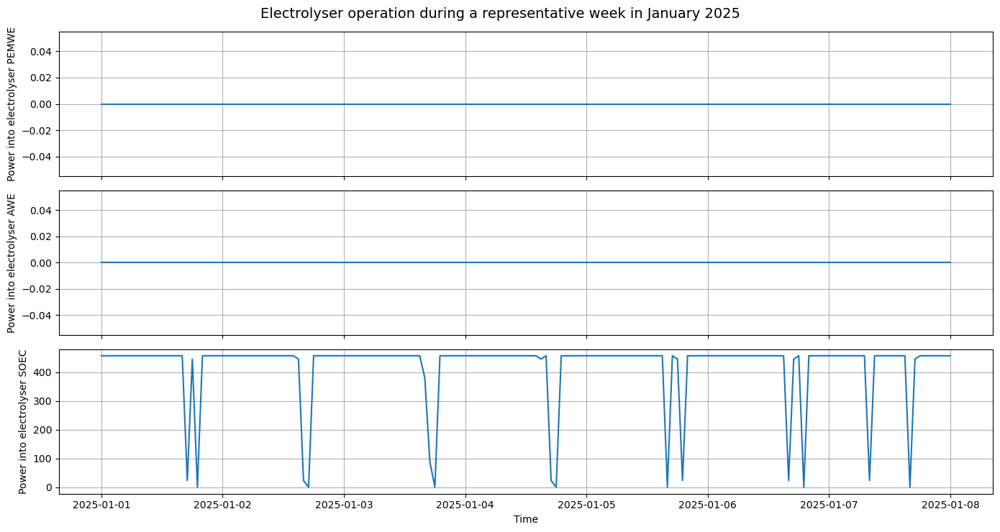

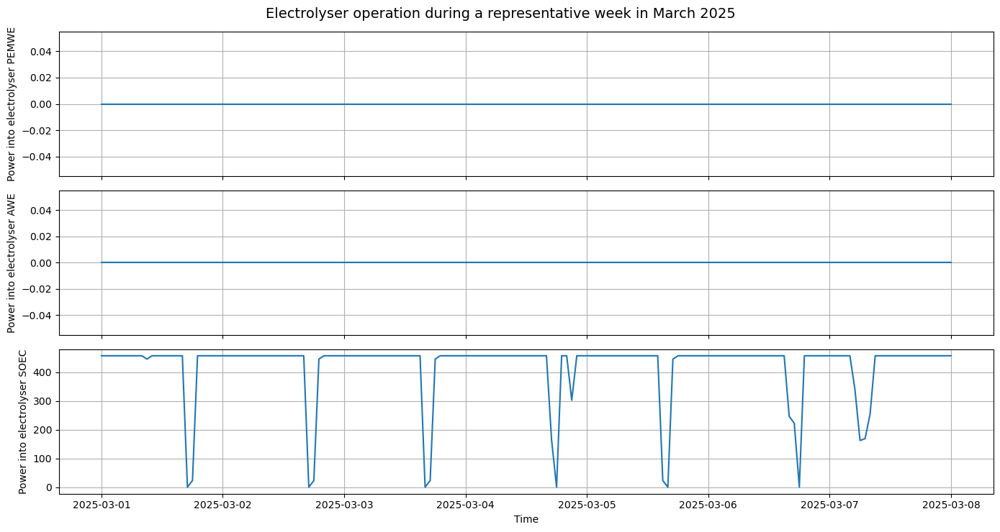

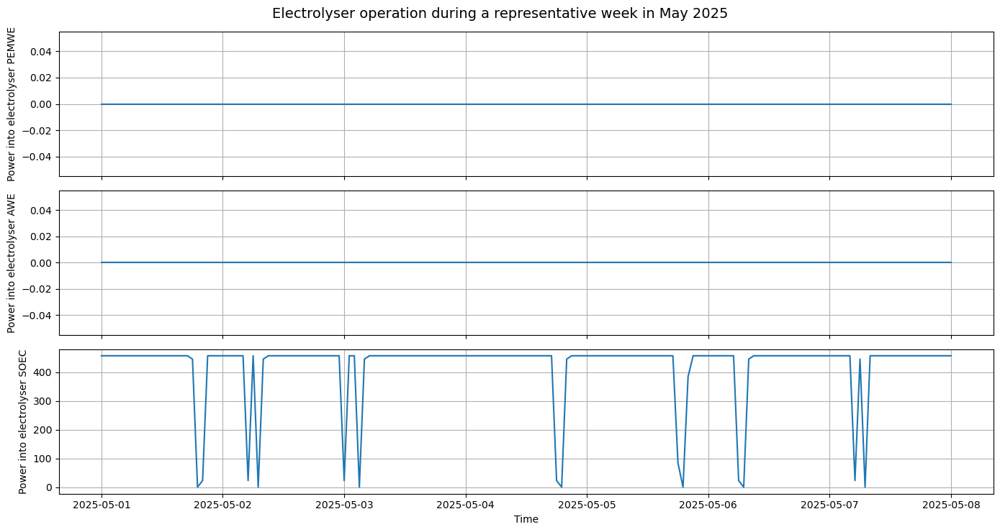

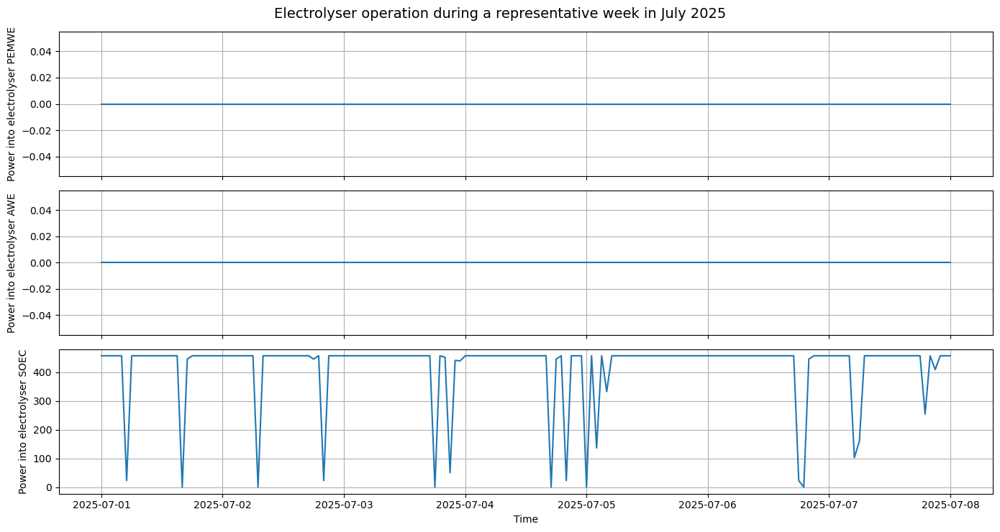

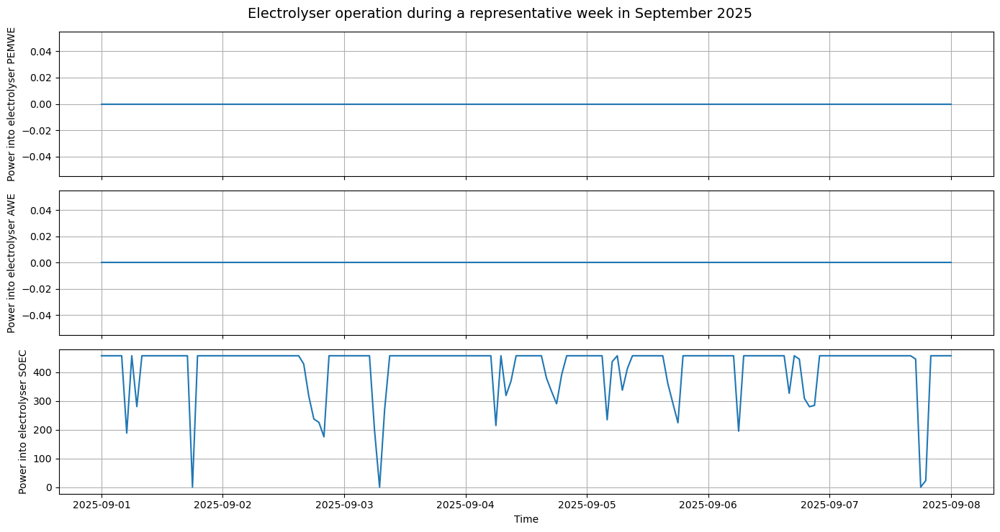

...

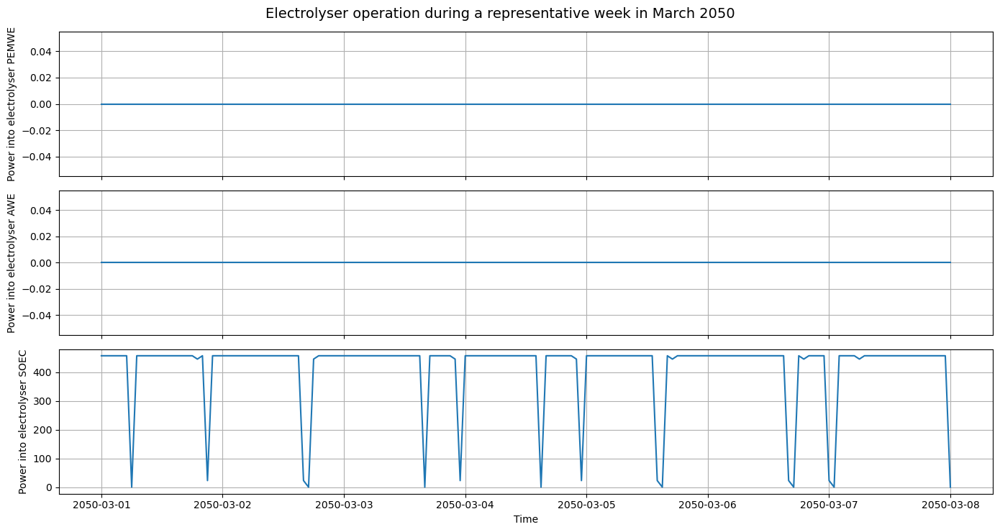

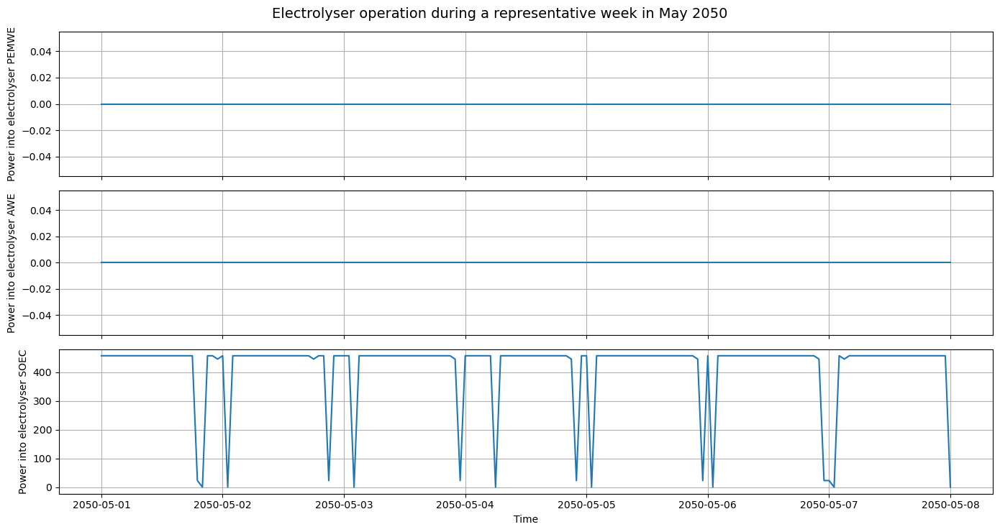

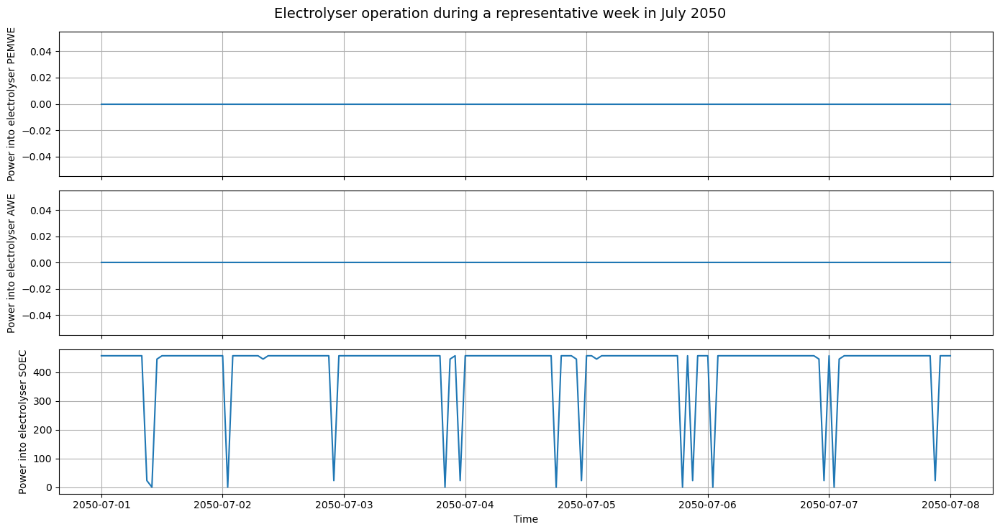

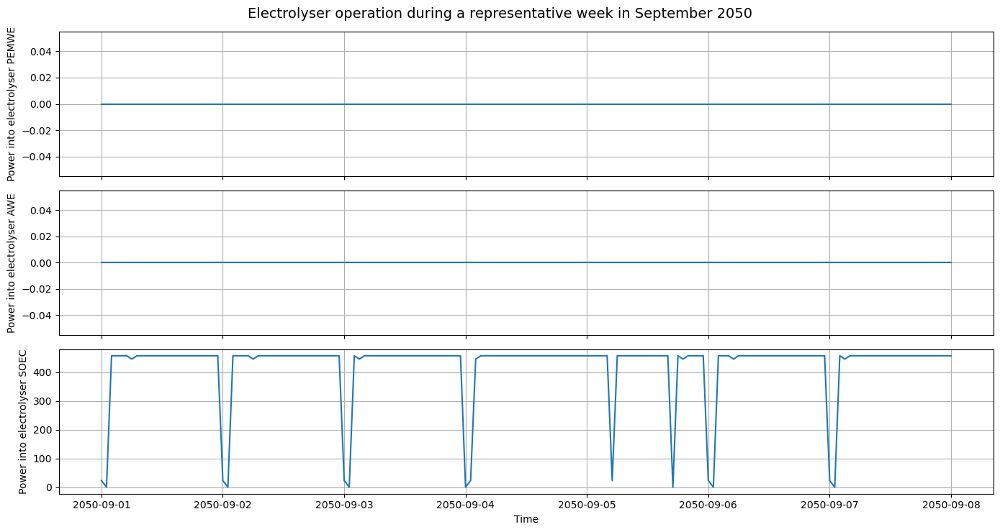

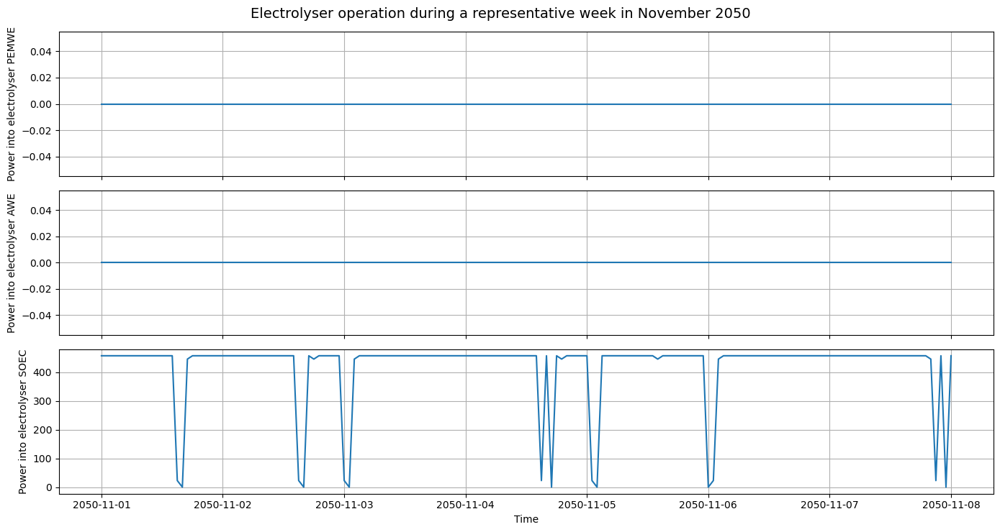

In [13]:
# Find gamma with second planning model
year_set = [2025,2030,2035,2040,2045,2050]
month_set = [1,3,5,7,9,11]
new_gamma3, proportion_of_hours_on_each_week3,P_Ez_sol3, P_Bat_in_sol3, P_Bat_out_sol3 = find_gamma(year_set,month_set,P_PPA,df_Grid, df_Elctro, df_Elctro_Costs,df_Battery,df_PPA,Demand,DemandCycle='Daily',GreenLimit='Weekly',df_lifetime=df_lifetime,df_rep_costs=df_2MW,PPA_sol = PPA_sol_2025_3, Ez_cap_sol=Ez_cap_sol_2025_3, Bat_cap_sol=Bat_cap_sol_2025_3, gamma=new_gamma2,alpha=2,beta=1,Project_Years=26,miprelstop=0.0,maxtime=600000)
print("new gamma:", new_gamma3)